In [1]:
import numpy as np
import pandas as pd
import awkward as ak
import uproot
import matplotlib.pyplot as plt
from IPython.display import Image, display
from matplotlib.colors import LogNorm

import gc
import itertools
import os
import glob
import hist

plt.rcParams['font.size'] = 16

```python
"""
Paths:
Chunk0950                    /Chunk0950/001_007/AO2Dtree.root
Chunk1000                    [ /Chunk1000/001_005/AO2Dtree.root, /Chunk1000/006_009/AO2Dtree.root ]
Chunk1010                    [ /Chunk1010/001_005/AO2Dtree.root, /Chunk1010/006_010/AO2Dtree.root ]
Chunk1020                    /Chunk1020/001_007/AO2Dtree.root
Chunk1030                    [ /Chunk1030/001_005/AO2Dtree.root, /Chunk1030/006_011/AO2Dtree.root ]
Chunk1040                    /Chunk1040/001_007/AO2Dtree.root
Chunk1050                    [ /Chunk1050/001_005/AO2Dtree.root, /Chunk1050/006_010/AO2Dtree.root ]
Chunk1100                    [ /Chunk1100/001_005/AO2Dtree.root, /Chunk1100/006_009/AO2Dtree.root ]
Chunk1110                    /Chunk1110/001_005/AO2Dtree.root
Chunk1120                    [ /Chunk1120/001_005/AO2Dtree.root, /Chunk1120/006_011/AO2Dtree.root ]
Chunk1130                    /Chunk1130/001_008/AO2Dtree.root
Chunk1140                    [ /Chunk1140/001_006/AO2Dtree.root, /Chunk1120/007_011/AO2Dtree.root ]
Chunk1150                    /Chunk1150/001_007/AO2Dtree.root
Chunk1200                    [ /Chunk1200/001_006/AO2Dtree.root, /Chunk1120/007_011/AO2Dtree.root ]
Chunk1210                    /Chunk1210/001_008/AO2Dtree.root
Chunk1220                    /Chunk1220/001_008/AO2Dtree.root
Chunk1300                    [ /Chunk1300/001_006/AO2Dtree.root, /Chunk1300/003/AO2Dtree.root, /Chunk1300/007_010/AO2Dtree.root ]
"""
```

In [2]:
# Real Data

#base_path = "../../mnt/SingleTrackTrees/Data/alice_data_2023_LHC23f_535087_apass4_1300_Thinner/Output/Run535087"
base_path = "~/Downloads"
which_chunk = ["Chunk0950", "Chunk1020", "Chunk1040"]
which_number = ["001_007", "001_007", "001_007"]
which_file = "AO2Dtree.root"

bucket = []

for k, chunk in enumerate(which_chunk):
    path = base_path + "/".join(["/", chunk, which_number[k], which_file])
    file = uproot.open(path)
    
    names_track_extr = file.keys(filter_name=r"*O2filtertrackextr")
    
    for i in range(len(names_track_extr)):
    
        df_trackextr = file[ names_track_extr[i] ].arrays(["fPt", "fEta", "fCharge", "fDcaXY", "fNsigmaTPCpi", "fNsigmaTPCka",
                                                           "fNsigmaTOFpi", "fNsigmaTOFka"], library="pd" )
        bucket.append(df_trackextr)

real_data = pd.concat(bucket, ignore_index=True)
real_data.head(5)

,fPt,fEta,fCharge,fDcaXY,fNsigmaTPCpi,fNsigmaTPCka,fNsigmaTOFpi,fNsigmaTOFka
0,0.471111,0.086615,-1,0.004583,1.296971,-6.567831,5.796030,-34.445034
1,0.537510,0.539420,1,0.011716,9.544146,1.979263,47.058315,2.731402
2,0.311392,0.052986,1,-0.005521,-1.248399,-12.175531,-999.000000,-999.000000
3,0.884602,-0.032689,-1,-0.001190,0.343225,-1.040863,-999.000000,-999.000000
4,0.371757,-0.593066,-1,0.003221,-1.047941,-8.668435,-999.000000,-999.000000


# Data analysis

In [3]:
# MC data

# initialization
final_results = pd.read_pickle("~/Downloads/ALICE/ALL_MC_with_BKG.pkl")

print(f"The uploaded dataframe has {len(final_results):_} rows and {len(final_results.columns):_} columns.")
memory = final_results.memory_usage(deep=True).sum() / (1024 ** 2)
print(f"It occupies {memory:_.2f} MB in RAM memory")

display( pd.concat([final_results.head(5),final_results.tail(5)]) )

mask_true_d0 = ( final_results["truth"] == 1 )
mask_true_anti_d0 = ( final_results["truth"] == -1 )
mask_signal = ( (mask_true_d0) | (mask_true_anti_d0) )
mask_background = ( final_results["truth"] == 0 )

d0_tot = np.sum( mask_true_d0 )
anti_d0_tot = np.sum( mask_true_anti_d0 )
signal_tot = d0_tot + anti_d0_tot
num_bg_pairs = np.sum( mask_background )
print("Number of D0:      ", d0_tot )
print("Number of anti-D0: ", anti_d0_tot )
print(f"Number of background pairs: {num_bg_pairs:_}")
print(f"Fraction of D0 and anti-D0 over total: {(d0_tot+anti_d0_tot)/len(final_results) * 100:.4f}%"  )

true_kaons = pd.DataFrame(
    {
    "mass" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["inv_mass"], final_results["anti_mass"] ], default=int(0)  ),
    "pt" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["neg_pt"], final_results["pos_pt"] ], default=int(0)  ),
    "fCharge" : np.select( [mask_true_d0, mask_true_anti_d0], [ -1, +1 ], default=0  ),
    "fNsigmaTOFka" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["neg_TOFka"], final_results["pos_TOFka"] ], default= -1000 ),
    "fNsigmaTPCka" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["neg_TPCka"], final_results["pos_TPCka"] ], default= -1000 ),
    # cross variable (wrong hypothesis)
    "fNsigmaTOFpi" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["neg_TOFpi"], final_results["pos_TOFpi"] ], default= -1000 ),
    "fNsigmaTPCpi" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["neg_TPCpi"], final_results["pos_TPCpi"] ], default= -1000 )
}
)

true_pions = pd.DataFrame(
    {
    "mass" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["inv_mass"], final_results["anti_mass"] ], default=int(0)  ),
    "pt" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["pos_pt"], final_results["neg_pt"] ], default=int(0)  ),
    "fCharge" : np.select( [mask_true_d0, mask_true_anti_d0], [ +1, -1 ], default=0  ),
    # cross variable (wrong hypothesis)
    "fNsigmaTOFka" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["pos_TOFka"], final_results["neg_TOFka"] ], default= -1000 ),
    "fNsigmaTPCka" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["pos_TPCka"], final_results["neg_TPCka"] ], default= -1000 ),
    # correct hypothesis
    "fNsigmaTOFpi" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["pos_TOFpi"], final_results["neg_TOFpi"] ], default= -1000 ),
    "fNsigmaTPCpi" : np.select( [mask_true_d0, mask_true_anti_d0], [ final_results["pos_TPCpi"], final_results["neg_TPCpi"] ], default= -1000 )
}   
)
true_kaons = true_kaons[true_kaons["mass"]!=0].reset_index(drop=True)
true_pions = true_pions[true_pions["mass"]!=0].reset_index(drop=True)

The uploaded dataframe has 71_693_465 rows and 21 columns.
It occupies 5_811.64 MB in RAM memory


,dcaXY_product,inv_mass,anti_mass,pt,decay_length,cos_pointing,neg_pt,neg_TPCka,neg_TOFka,neg_fDcaXY,...,pos_TPCpi,pos_TOFpi,pos_fDcaXY,neg_TPCpi,neg_TOFpi,pos_TPCka,pos_TOFka,mother_pdg_pos,truth,same_mother
0,-0.000008,1.803016,1.778223,1.575074,0.004660,0.995067,1.014060,-0.055695,-999.0,0.002824,...,1.080044,1.812436,-0.002688,0.413968,-999.0,1.759560,-3.427866,0.0,0,True
1,0.000008,2.215073,2.207963,0.473187,0.013202,0.053475,1.014060,-0.055695,-999.0,0.002824,...,0.829078,-999.000000,0.002763,0.413968,-999.0,1.572557,-999.000000,0.0,0,True
2,-0.000030,2.206993,2.182972,0.957466,0.011976,-0.798503,0.857933,8.520977,-999.0,0.011094,...,1.080044,1.812436,-0.002688,9.819099,-999.0,1.759560,-3.427866,0.0,0,True
3,0.000031,1.077656,1.055248,1.876580,0.016502,-0.898782,0.857933,8.520977,-999.0,0.011094,...,0.829078,-999.000000,0.002763,9.819099,-999.0,1.572557,-999.000000,0.0,0,True
4,-0.000006,1.802861,1.811291,1.872615,0.004316,-0.990615,1.388882,2.086939,-999.0,0.002292,...,1.080044,1.812436,-0.002688,1.018354,-999.0,1.759560,-3.427866,0.0,0,True
71693460,-0.000007,0.817484,0.819815,1.942073,0.027600,-0.992015,0.931452,0.829556,-999.0,-0.006850,...,-0.338925,-5.902093,0.001065,0.190194,-999.0,0.125043,-18.729809,0.0,0,True
71693461,-0.000029,1.276946,1.442003,0.654153,0.484136,0.599167,0.964872,0.921494,-999.0,0.000284,...,-0.598109,-999.000000,-0.103506,0.410306,-999.0,-10.056605,-999.000000,0.0,0,True
71693462,0.000004,2.277966,2.295974,0.220301,0.159155,-0.915865,0.964872,0.921494,-999.0,0.000284,...,0.555073,-999.000000,0.014991,0.410306,-999.0,-0.200770,-999.000000,0.0,0,True
71693463,-0.001381,0.990568,0.992497,0.324600,0.118799,-0.578420,0.317333,-8.562991,-999.0,0.013340,...,-0.598109,-999.000000,-0.103506,1.895879,-999.0,-10.056605,-999.000000,0.0,0,True
71693464,0.000200,1.194881,1.045351,0.706488,0.026848,-0.106647,0.317333,-8.562991,-999.0,0.013340,...,0.555073,-999.000000,0.014991,1.895879,-999.0,-0.200770,-999.000000,0.0,0,True


Number of D0:       14507
Number of anti-D0:  15105
Number of background pairs: 71_663_853
Fraction of D0 and anti-D0 over total: 0.0413%


## Real data vs MC: TOFka and TPCka

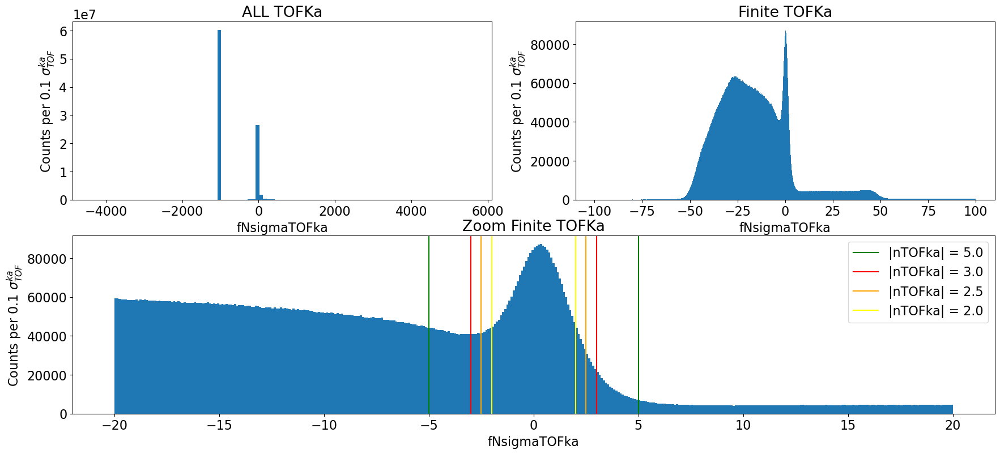

Unavailable TOFka: 67.60%
TOFka distribution in % (These are referred to the portion of data whose TOFka is not -999)


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Finite TOFKa,2.89,5.49,7.66,9.41,10.82,11.99,13.96,15.76,19.36,25.04
% of Total,0.94,1.78,2.48,3.05,3.5,3.88,4.52,5.11,6.27,8.11


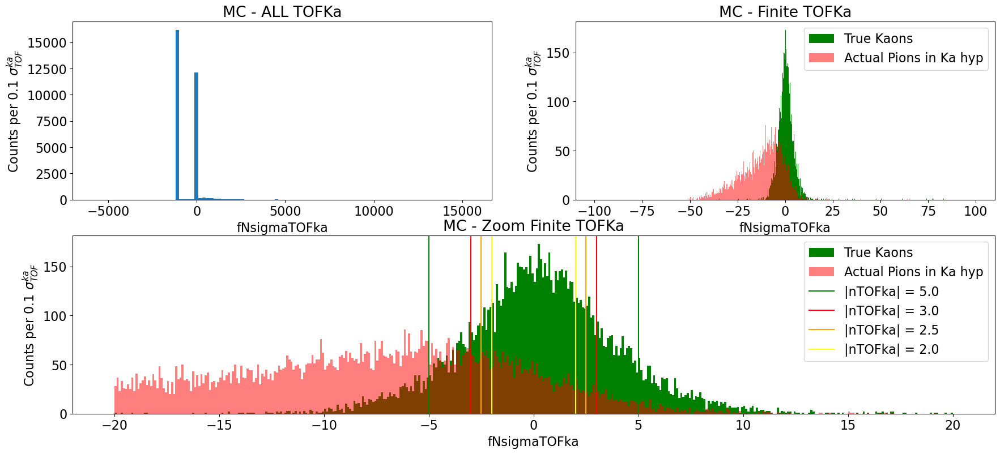

Unavailable TOFka: 54.62%
TOFka distribution in % (These are referred to the portion of data whose TOFka is not -999)


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Finite TOFKa in MC,11.11,21.7,32.0,41.0,48.88,55.77,66.53,74.72,83.6,88.51
% of Total,5.04,9.85,14.52,18.6,22.18,25.31,30.19,33.91,37.94,40.17


In [4]:
N_BINS = 100
bin_width = 0.1

mosaic = [
    ["ALL TOFKa", "Finite TOFKa"],
    ["Finite ZOOM TOFKa", "Finite ZOOM TOFKa"]
]


fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

NA_TOFKa_mask = real_data["fNsigmaTOFka"] == -999

axes["ALL TOFKa"].hist(real_data["fNsigmaTOFka"], bins=N_BINS)
axes["ALL TOFKa"].set_title("ALL TOFKa")
axes["ALL TOFKa"].set_xlabel("fNsigmaTOFka")
axes["ALL TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")

axes["Finite TOFKa"].hist(real_data[~NA_TOFKa_mask]["fNsigmaTOFka"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width))
axes["Finite TOFKa"].set_title("Finite TOFKa")
axes["Finite TOFKa"].set_xlabel("fNsigmaTOFka")
axes["Finite TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")

axes["Finite ZOOM TOFKa"].hist(real_data[~NA_TOFKa_mask]["fNsigmaTOFka"], range=(-20,20), bins=np.arange(-20,20+bin_width, bin_width))
axes["Finite ZOOM TOFKa"].set_title("Zoom Finite TOFKa")
axes["Finite ZOOM TOFKa"].axvline(x=-5, color="green", label="|nTOFka| = 5.0")
axes["Finite ZOOM TOFKa"].axvline(x=+5, color="green")
axes["Finite ZOOM TOFKa"].axvline(x=-3, color="red", label="|nTOFka| = 3.0")
axes["Finite ZOOM TOFKa"].axvline(x=+3, color="red")
axes["Finite ZOOM TOFKa"].axvline(x=-2.5, color="orange", label="|nTOFka| = 2.5")
axes["Finite ZOOM TOFKa"].axvline(x=+2.5, color="orange")
axes["Finite ZOOM TOFKa"].axvline(x=-2.0, color="yellow", label="|nTOFka| = 2.0")
axes["Finite ZOOM TOFKa"].axvline(x=+2.0, color="yellow")
axes["Finite ZOOM TOFKa"].set_xlabel("fNsigmaTOFka")
axes["Finite ZOOM TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")
plt.legend()
plt.savefig("RealDataTOFKa.png")
plt.show()

tot = len(real_data)
tot_NA_TOFKA = np.sum(NA_TOFKa_mask)
tot_finite_TOFKA = tot - tot_NA_TOFKA
print(f"Unavailable TOFka: {tot_NA_TOFKA/tot*100:.2f}%")

TOFka_slice = [ [-0.5,0.5], [-1, 1], [-1.5,1.5], [-2.0,2.0], [-2.5, 2.5], [-3.0, 3.0], [-4.0, 4.0], [-5, 5], [-7,7], [-10,10] ]
TOFka_bucket = []
for i in range (len(TOFka_slice)):
    TOFka_lim = TOFka_slice[i]
    TOFka_bucket.append( np.sum(real_data["fNsigmaTOFka"].between(TOFka_lim[0], TOFka_lim[1]))/tot_finite_TOFKA )
TOFka_recap = pd.DataFrame(columns=[str(item) for item in TOFka_slice], index=["% of Finite TOFKa", "% of Total"])
TOFka_recap.loc["% of Finite TOFKa"] = TOFka_bucket
TOFka_recap.loc["% of Total"] = np.array(TOFka_bucket)*tot_finite_TOFKA/tot
pd.set_option("display.precision", 2)
print("TOFka distribution in % (These are referred to the portion of data whose TOFka is not -999)")
display(TOFka_recap*100)

mosaic = [
    ["ALL TOFKa", "Finite TOFKa"],
    ["Finite ZOOM TOFKa", "Finite ZOOM TOFKa"]
]


fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

MC_NA_TOFKa_mask = true_kaons["fNsigmaTOFka"] == -999

axes["ALL TOFKa"].hist(true_kaons["fNsigmaTOFka"], bins=N_BINS)
axes["ALL TOFKa"].set_title("MC - ALL TOFKa")
axes["ALL TOFKa"].set_xlabel("fNsigmaTOFka")
axes["ALL TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")

MC_NA_TOFKa_mask_refl = true_pions["fNsigmaTOFka"] == -999
axes["Finite TOFKa"].hist(true_kaons[~MC_NA_TOFKa_mask]["fNsigmaTOFka"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width),
                          color = "green", label="True Kaons")
axes["Finite TOFKa"].hist(true_pions[~MC_NA_TOFKa_mask_refl]["fNsigmaTOFka"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width),
                          color = "red", label="Actual Pions in Ka hyp", alpha=0.5)
axes["Finite TOFKa"].set_title("MC - Finite TOFKa")
axes["Finite TOFKa"].set_xlabel("fNsigmaTOFka")
axes["Finite TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")
axes["Finite TOFKa"].legend()

axes["Finite ZOOM TOFKa"].hist(true_kaons[~MC_NA_TOFKa_mask]["fNsigmaTOFka"], range=(-20,20), bins=np.arange(-20,20+bin_width, bin_width),
                               color="green", label="True Kaons")
axes["Finite ZOOM TOFKa"].hist(true_pions[~MC_NA_TOFKa_mask_refl]["fNsigmaTOFka"], range=(-20,20), bins=np.arange(-20, 20+bin_width, bin_width),
                          color = "red", label="Actual Pions in Ka hyp", alpha=0.5)
axes["Finite ZOOM TOFKa"].set_title("MC - Zoom Finite TOFKa")
axes["Finite ZOOM TOFKa"].axvline(x=-5, color="green", label="|nTOFka| = 5.0")
axes["Finite ZOOM TOFKa"].axvline(x=+5, color="green")
axes["Finite ZOOM TOFKa"].axvline(x=-3, color="red", label="|nTOFka| = 3.0")
axes["Finite ZOOM TOFKa"].axvline(x=+3, color="red")
axes["Finite ZOOM TOFKa"].axvline(x=-2.5, color="orange", label="|nTOFka| = 2.5")
axes["Finite ZOOM TOFKa"].axvline(x=+2.5, color="orange")
axes["Finite ZOOM TOFKa"].axvline(x=-2.0, color="yellow", label="|nTOFka| = 2.0")
axes["Finite ZOOM TOFKa"].axvline(x=+2.0, color="yellow")
axes["Finite ZOOM TOFKa"].set_xlabel("fNsigmaTOFka")
axes["Finite ZOOM TOFKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TOF}^{ka}$")
axes["Finite ZOOM TOFKa"].legend()
plt.legend()
plt.savefig("MCDataTOFKa.png")
plt.show()

MC_tot = len(true_kaons)
MC_tot_NA_TOFKA = np.sum(MC_NA_TOFKa_mask)
MC_tot_finite_TOFKA = MC_tot - MC_tot_NA_TOFKA
print(f"Unavailable TOFka: {MC_tot_NA_TOFKA/MC_tot*100:.2f}%")
MC_TOFka_bucket = []

for i in range (len(TOFka_slice)):
    TOFka_lim = TOFka_slice[i]
    MC_TOFka_bucket.append( np.sum(true_kaons["fNsigmaTOFka"].between(TOFka_lim[0], TOFka_lim[1]))/MC_tot_finite_TOFKA )
MC_TOFka_recap = pd.DataFrame(columns=[str(item) for item in TOFka_slice], index=["% of Finite TOFKa in MC", "% of Total"])
MC_TOFka_recap.loc["% of Finite TOFKa in MC"] = MC_TOFka_bucket
MC_TOFka_recap.loc["% of Total"] = np.array(MC_TOFka_bucket)*MC_tot_finite_TOFKA/MC_tot
pd.set_option("display.precision", 2)
print("TOFka distribution in % (These are referred to the portion of data whose TOFka is not -999)")
display(MC_TOFka_recap*100)

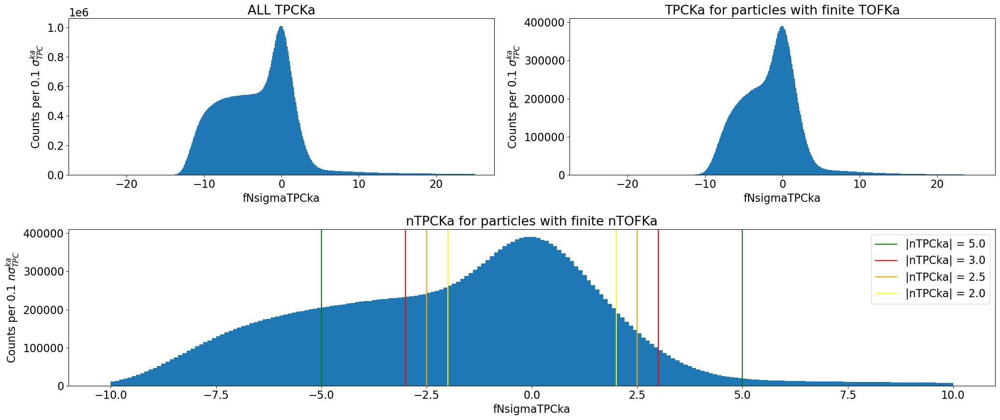

TPCka distribution in %


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Total,11.11,21.1,29.4,36.09,41.56,46.18,53.94,60.71,73.38,90.41


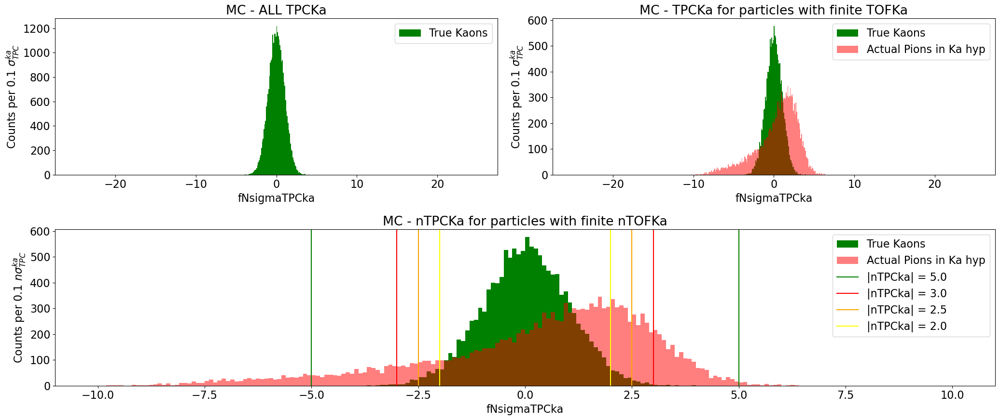

,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Total in MC,38.37,68.08,86.43,95.5,98.85,99.77,100.0,100.0,100.0,100.0


In [5]:
# I fix the bin width instead of number of bins for an easier comparison between the various graphs
bin_width = 0.1

mosaic = [
    ["ALL TPCKa", "Finite TPCKa"],
    ["ZOOM TPCKa", "ZOOM TPCKa"]
]

fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

axes["ALL TPCKa"].hist(real_data["fNsigmaTPCka"],range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ) )
axes["ALL TPCKa"].set_title("ALL TPCKa")
axes["ALL TPCKa"].set_xlabel("fNsigmaTPCka")
axes["ALL TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{ka}$")

axes["Finite TPCKa"].hist(real_data[~NA_TOFKa_mask]["fNsigmaTPCka"], range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ))
axes["Finite TPCKa"].set_title("TPCKa for particles with finite TOFKa")
axes["Finite TPCKa"].set_xlabel("fNsigmaTPCka")
axes["Finite TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{ka}$")

axes["ZOOM TPCKa"].hist(real_data[~NA_TOFKa_mask]["fNsigmaTPCka"], range=(-10,10), bins=np.arange(-10,10+bin_width, bin_width ))
axes["ZOOM TPCKa"].set_title("nTPCKa for particles with finite nTOFKa")
axes["ZOOM TPCKa"].axvline(x=-5, color="green", label="|nTPCka| = 5.0")
axes["ZOOM TPCKa"].axvline(x=+5, color="green")
axes["ZOOM TPCKa"].axvline(x=-3, color="red", label="|nTPCka| = 3.0")
axes["ZOOM TPCKa"].axvline(x=+3, color="red")
axes["ZOOM TPCKa"].axvline(x=-2.5, color="orange", label="|nTPCka| = 2.5")
axes["ZOOM TPCKa"].axvline(x=+2.5, color="orange")
axes["ZOOM TPCKa"].axvline(x=-2.0, color="yellow", label="|nTPCka| = 2.0")
axes["ZOOM TPCKa"].axvline(x=+2.0, color="yellow")
axes["ZOOM TPCKa"].set_xlabel("fNsigmaTPCka")
axes["ZOOM TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$n\sigma_{TPC}^{ka}$")
plt.legend()

plt.tight_layout()
plt.savefig("RealDataTPCKa.png")
plt.show()

TPCka_slice = [ [-0.5,0.5], [-1, 1], [-1.5,1.5], [-2.0,2.0], [-2.5, 2.5], [-3.0, 3.0], [-4.0, 4.0], [-5, 5], [-7,7], [-10,10] ]
TPCka_bucket = []
for i in range (len(TPCka_slice)):
    TPCka_lim = TPCka_slice[i]
    TPCka_bucket.append( np.sum(real_data["fNsigmaTPCka"].between(TPCka_lim[0], TPCka_lim[1]))/tot)
TPCKa_recap = pd.DataFrame(columns=[str(item) for item in TPCka_slice], index=["% of Total"])
TPCKa_recap.loc["% of Total"] = TPCka_bucket
pd.set_option("display.precision", 2)
print("TPCka distribution in %")
display(TPCKa_recap*100)

mosaic = [
    ["ALL TPCKa", "Finite TPCKa"],
    ["ZOOM TPCKa", "ZOOM TPCKa"]
]

fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

axes["ALL TPCKa"].hist(true_kaons["fNsigmaTPCka"],range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ), color="green", label="True Kaons")
axes["ALL TPCKa"].set_title("MC - ALL TPCKa")
axes["ALL TPCKa"].set_xlabel("fNsigmaTPCka")
axes["ALL TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{ka}$")
axes["ALL TPCKa"].legend()

axes["Finite TPCKa"].hist(true_kaons[~MC_NA_TOFKa_mask]["fNsigmaTPCka"], range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ),
                          color = "green", label="True Kaons")
axes["Finite TPCKa"].hist(true_pions[~MC_NA_TOFKa_mask_refl]["fNsigmaTPCka"], range=(-25,25), bins=np.arange(-25, 25+bin_width, bin_width),
                          color = "red", label="Actual Pions in Ka hyp", alpha=0.5)
axes["Finite TPCKa"].set_title("MC - TPCKa for particles with finite TOFKa")
axes["Finite TPCKa"].set_xlabel("fNsigmaTPCka")
axes["Finite TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{ka}$")
axes["Finite TPCKa"].legend()

axes["ZOOM TPCKa"].hist(true_kaons[~MC_NA_TOFKa_mask]["fNsigmaTPCka"], range=(-10,10), bins=np.arange(-10,10+bin_width, bin_width ),
                        color = "green", label="True Kaons")
axes["ZOOM TPCKa"].hist(true_pions[~MC_NA_TOFKa_mask_refl]["fNsigmaTPCka"], range=(-10,10), bins=np.arange(-10, 10+bin_width, bin_width),
                          color = "red", label="Actual Pions in Ka hyp", alpha=0.5)
axes["ZOOM TPCKa"].set_title("MC - nTPCKa for particles with finite nTOFKa")
axes["ZOOM TPCKa"].axvline(x=-5, color="green", label="|nTPCka| = 5.0")
axes["ZOOM TPCKa"].axvline(x=+5, color="green")
axes["ZOOM TPCKa"].axvline(x=-3, color="red", label="|nTPCka| = 3.0")
axes["ZOOM TPCKa"].axvline(x=+3, color="red")
axes["ZOOM TPCKa"].axvline(x=-2.5, color="orange", label="|nTPCka| = 2.5")
axes["ZOOM TPCKa"].axvline(x=+2.5, color="orange")
axes["ZOOM TPCKa"].axvline(x=-2.0, color="yellow", label="|nTPCka| = 2.0")
axes["ZOOM TPCKa"].axvline(x=+2.0, color="yellow")
axes["ZOOM TPCKa"].set_xlabel("fNsigmaTPCka")
axes["ZOOM TPCKa"].set_ylabel(f"Counts per {bin_width} " + r"$n\sigma_{TPC}^{ka}$")
plt.legend()

plt.tight_layout()
plt.savefig("MCDataTPCKa.png")
plt.show()

MC_TPCka_bucket = []
for i in range (len(TPCka_slice)):
    TPCka_lim = TPCka_slice[i]
    MC_TPCka_bucket.append( np.sum(true_kaons["fNsigmaTPCka"].between(TPCka_lim[0], TPCka_lim[1]))/MC_tot)
MC_TPCKa_recap = pd.DataFrame(columns=[str(item) for item in TPCka_slice], index=["% of Total in MC"])
MC_TPCKa_recap.loc["% of Total in MC"] = MC_TPCka_bucket
pd.set_option("display.precision", 2)
display(MC_TPCKa_recap*100)

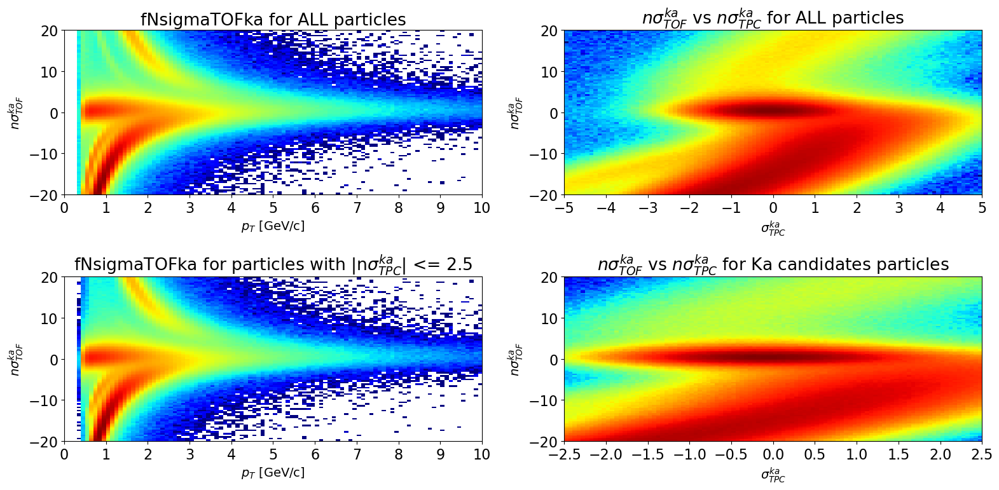

In [6]:
min_cut_TOF_KA, max_cut_TOF_KA = -20.0, 20.0
min_cut_TPC_KA, max_cut_TPC_KA = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(real_data["fPt"], real_data["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title("fNsigmaTOFka for ALL particles")

axes["top right"].hist2d(real_data["fNsigmaTPCka"], real_data["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_KA,max_cut_TPC_KA],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_KA, max_cut_TPC_KA )
axes["top right"].set_xticks(np.arange(min_cut_TPC_KA, max_cut_TPC_KA+1, 1) )
axes["top right"].set_title(r"$n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for ALL particles")

# Let's see for those that are more likely to be actual Kaons
TPCKa_cut = 2.5
TPC_Ka_mask = real_data["fNsigmaTPCka"].abs() <= TPCKa_cut

axes["bot left"].hist2d(real_data[TPC_Ka_mask]["fPt"], real_data[TPC_Ka_mask]["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title(r"fNsigmaTOFka for particles with |n$\sigma^{ka}_{TPC}$| <= " + f"{TPCKa_cut:.1f}")

axes["bot right"].hist2d(real_data[TPC_Ka_mask]["fNsigmaTPCka"], real_data[TPC_Ka_mask]["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[-TPCKa_cut,+TPCKa_cut],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(-TPCKa_cut, +TPCKa_cut )
axes["bot right"].set_xticks(np.arange(-TPCKa_cut, TPCKa_cut+0.5, 0.5) )
axes["bot right"].set_title(r"$n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for Ka candidates particles")
# axes["bot right"].axhline(y=-5, color="green", label="|nTOFka| = 5.0")
# axes["bot right"].axhline(y=+5, color="green")
# axes["bot right"].axhline(y=-3, color="red", label="|nTOFka| = 3.0")
# axes["bot right"].axhline(y=+3, color="red", label="|nTOFka| = 3.0")

plt.tight_layout()
plt.show()

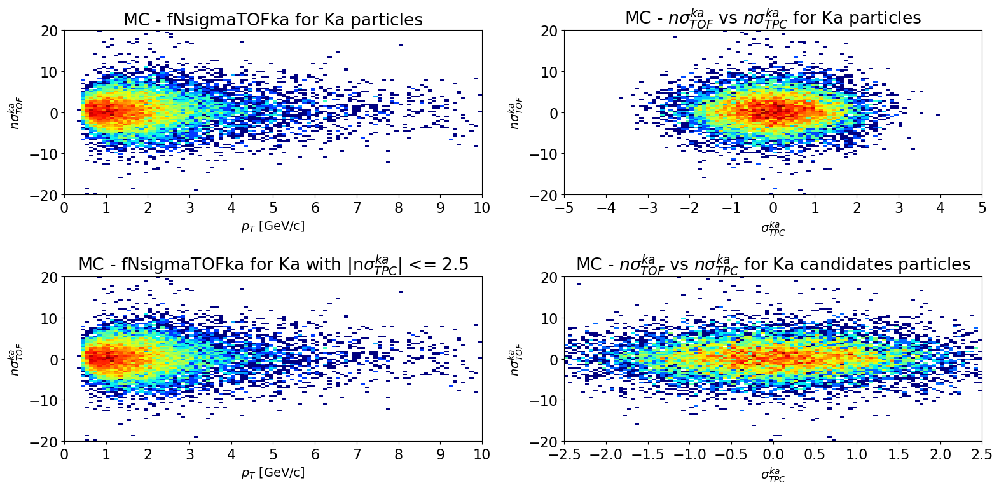

In [7]:
min_cut_TOF_KA, max_cut_TOF_KA = -20.0, 20.0
min_cut_TPC_KA, max_cut_TPC_KA = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(true_kaons["pt"], true_kaons["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title("MC - fNsigmaTOFka for Ka particles")

axes["top right"].hist2d(true_kaons["fNsigmaTPCka"], true_kaons["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_KA,max_cut_TPC_KA],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_KA, max_cut_TPC_KA )
axes["top right"].set_xticks(np.arange(min_cut_TPC_KA, max_cut_TPC_KA+1, 1) )
axes["top right"].set_title(r"MC - $n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for Ka particles")

# Let's see for those that are more likely to be actual Kaons
TPCKa_cut = 2.5
MC_TPC_Ka_mask = true_kaons["fNsigmaTPCka"].abs() <= TPCKa_cut

axes["bot left"].hist2d(true_kaons[MC_TPC_Ka_mask]["pt"], true_kaons[MC_TPC_Ka_mask]["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title(r"MC - fNsigmaTOFka for Ka with |n$\sigma^{ka}_{TPC}$| <= " + f"{TPCKa_cut:.1f}")

axes["bot right"].hist2d(true_kaons[MC_TPC_Ka_mask]["fNsigmaTPCka"], true_kaons[MC_TPC_Ka_mask]["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[-TPCKa_cut,+TPCKa_cut],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(-TPCKa_cut, +TPCKa_cut )
axes["bot right"].set_xticks(np.arange(-TPCKa_cut, TPCKa_cut+0.5, 0.5) )
axes["bot right"].set_title(r"MC - $n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for Ka candidates particles")
# axes["bot right"].axhline(y=-5, color="green", label="|nTOFka| = 5.0")
# axes["bot right"].axhline(y=+5, color="green")
# axes["bot right"].axhline(y=-3, color="red", label="|nTOFka| = 3.0")
# axes["bot right"].axhline(y=+3, color="red", label="|nTOFka| = 3.0")

plt.tight_layout()
plt.show()

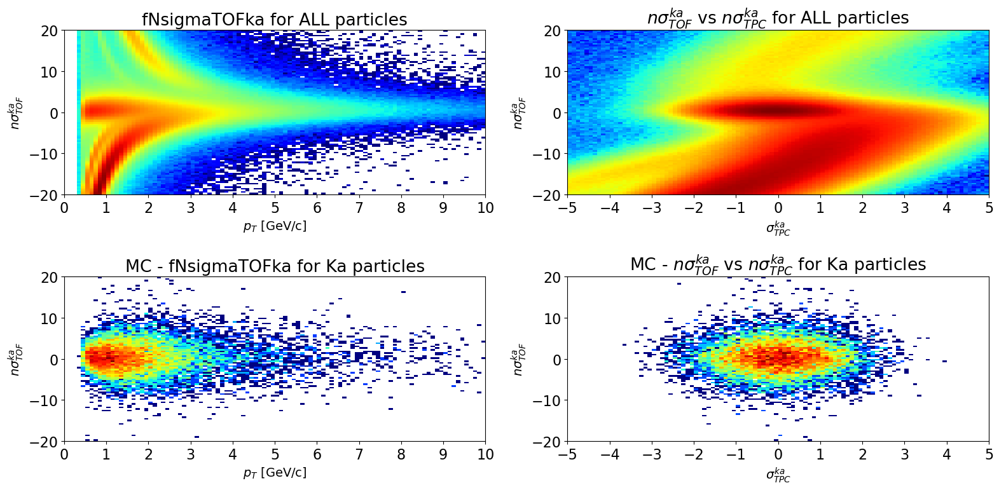

In [8]:
# comparison in one
min_cut_TOF_KA, max_cut_TOF_KA = -20.0, 20.0
min_cut_TPC_KA, max_cut_TPC_KA = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(real_data["fPt"], real_data["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title("fNsigmaTOFka for ALL particles")

axes["top right"].hist2d(real_data["fNsigmaTPCka"], real_data["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_KA,max_cut_TPC_KA],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_KA, max_cut_TPC_KA )
axes["top right"].set_xticks(np.arange(min_cut_TPC_KA, max_cut_TPC_KA+1, 1) )
axes["top right"].set_title(r"$n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for ALL particles")

axes["bot left"].hist2d(true_kaons["pt"], true_kaons["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title("MC - fNsigmaTOFka for Ka particles")

axes["bot right"].hist2d(true_kaons["fNsigmaTPCka"], true_kaons["fNsigmaTOFka"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_KA,max_cut_TPC_KA],[min_cut_TOF_KA,max_cut_TOF_KA]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{ka}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(min_cut_TPC_KA, max_cut_TPC_KA )
axes["bot right"].set_xticks(np.arange(min_cut_TPC_KA, max_cut_TPC_KA+1, 1) )
axes["bot right"].set_title(r"MC - $n\sigma^{ka}_{TOF}$ vs $n\sigma^{ka}_{TPC}$ for Ka particles")

plt.tight_layout()
plt.savefig("ComparisonTOFKa.png")
plt.show()

## Real data: TOFka and TPCka, now in pt_slice (This is the pt of the unknown daughter particle)

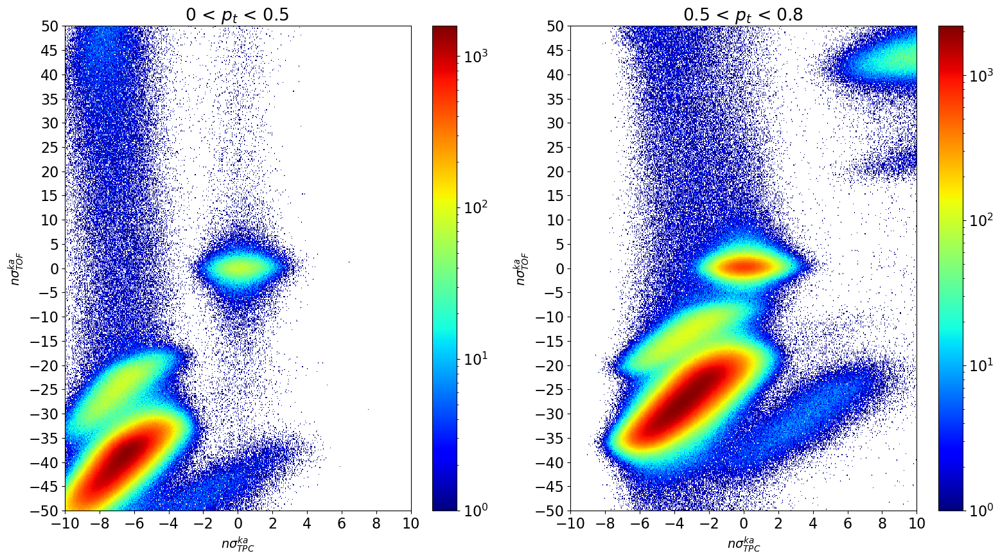

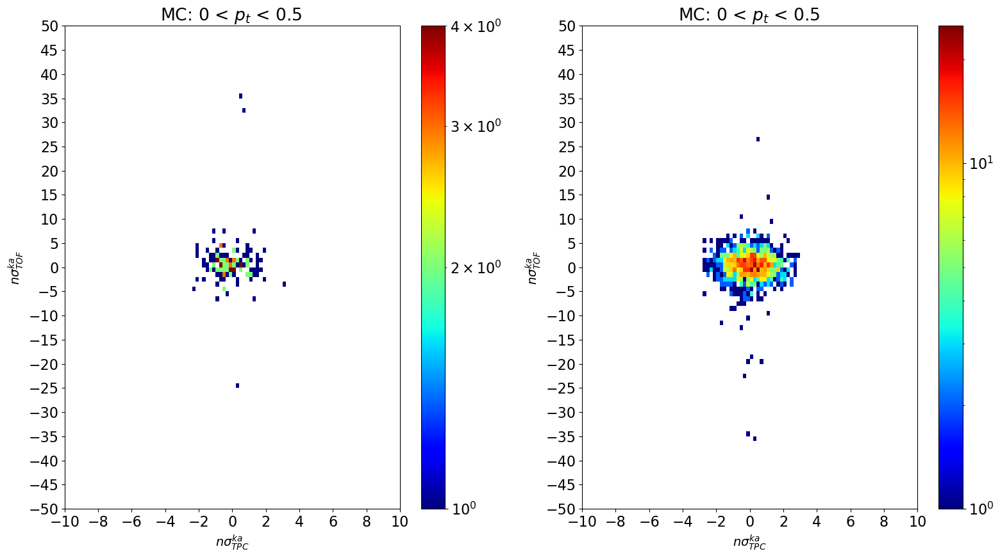

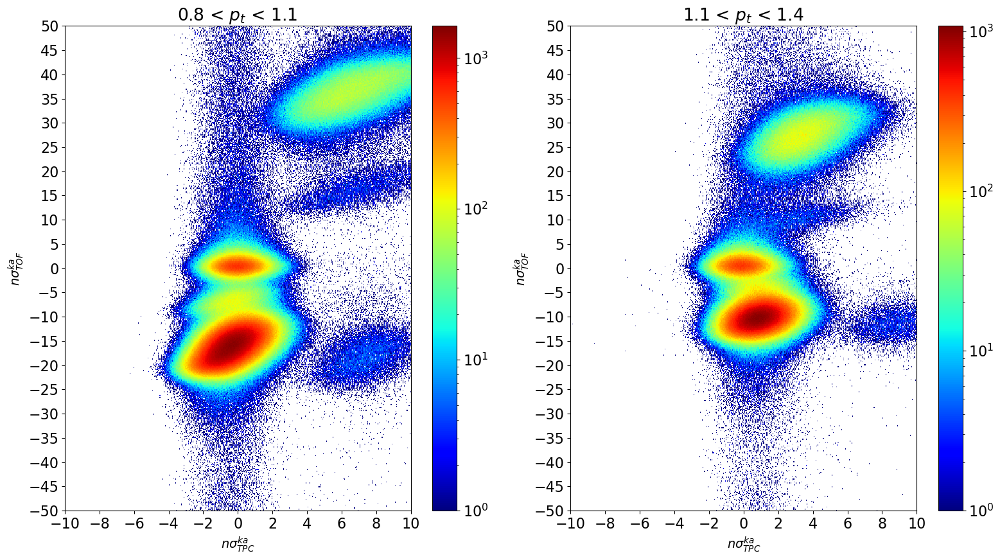

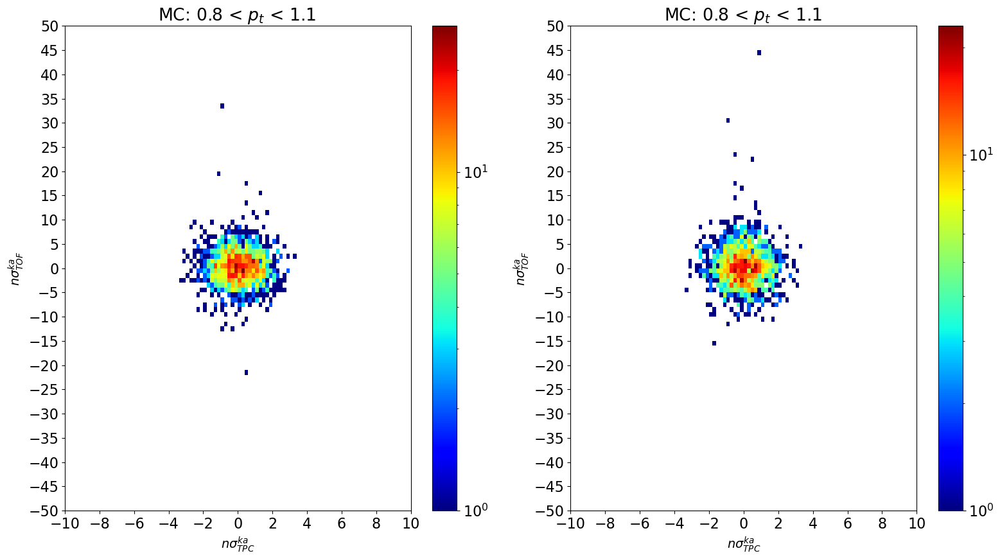

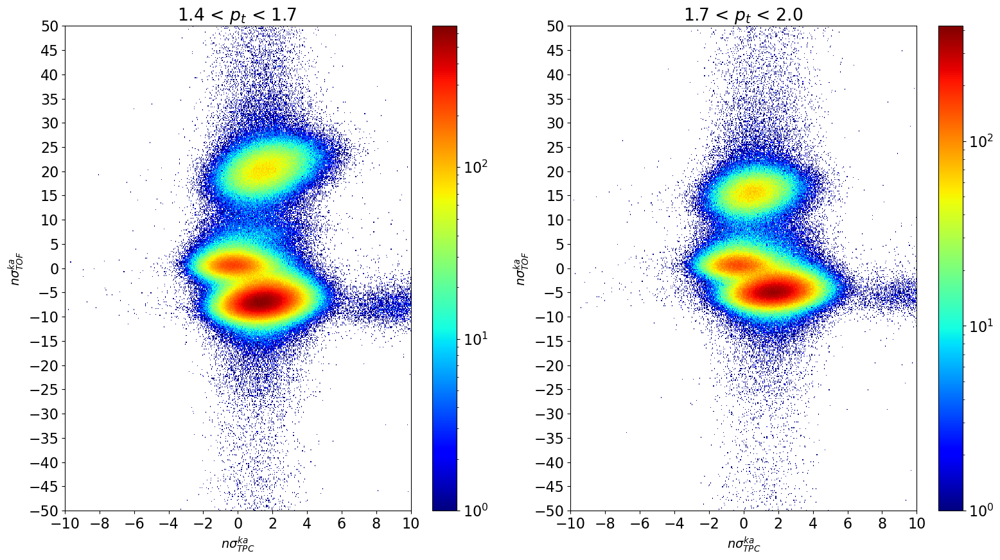

...

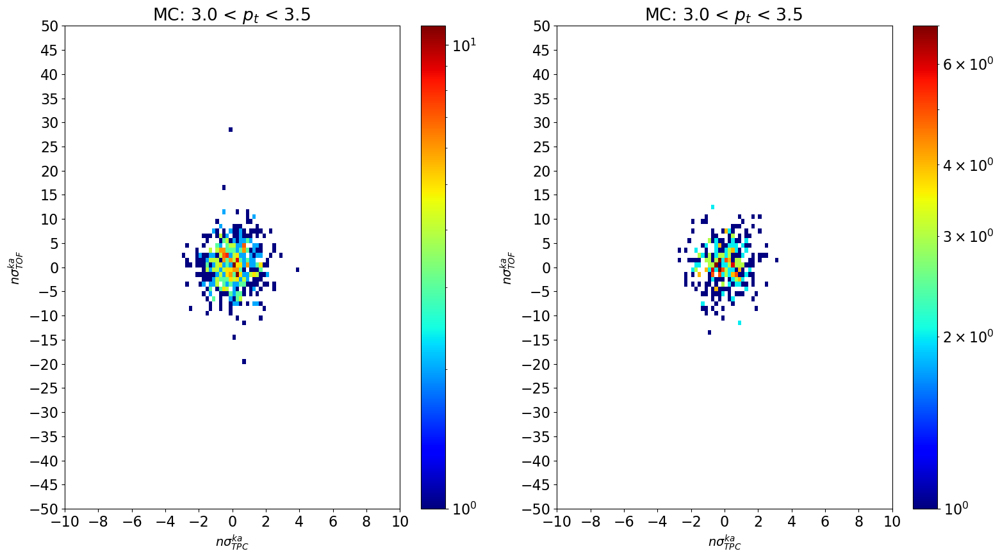

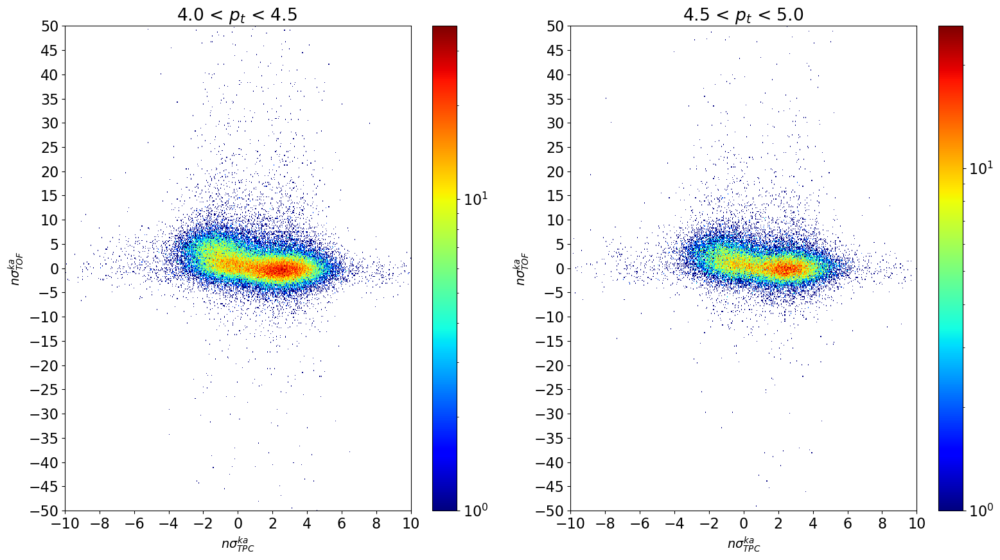

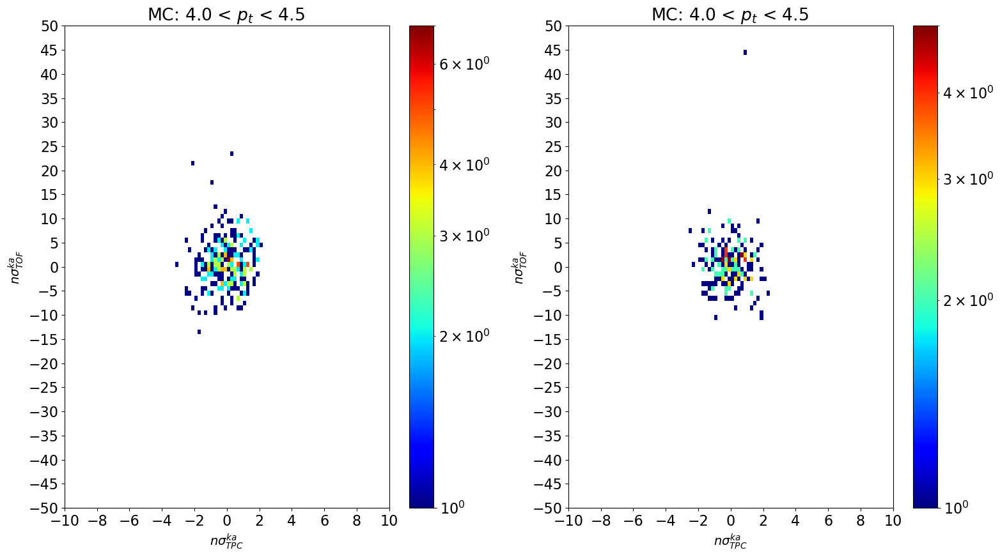

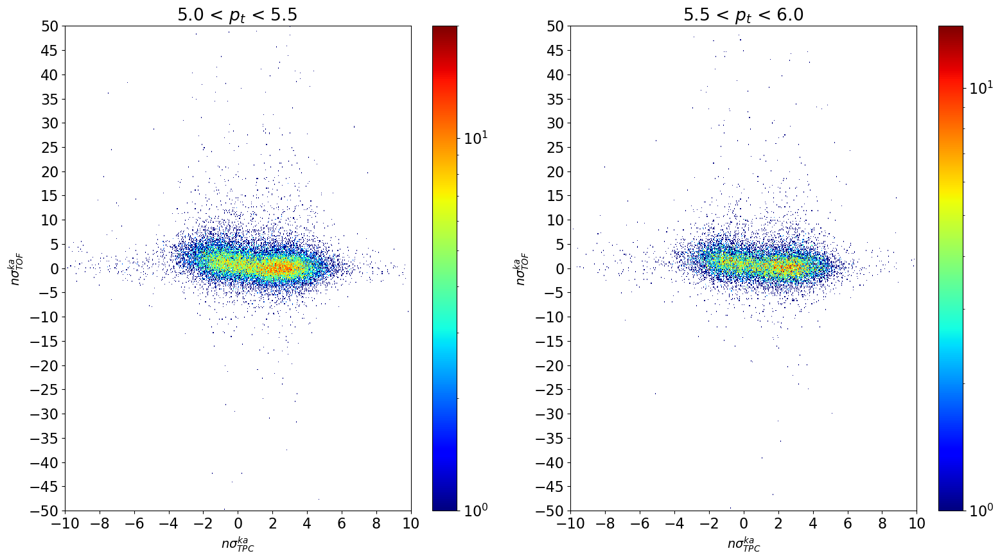

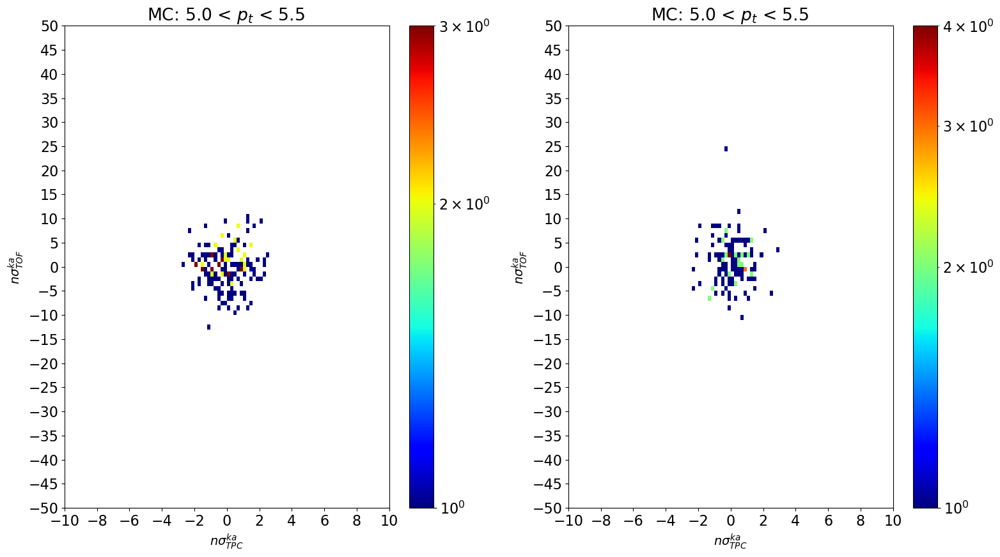

In [9]:
pt_slices = [ [0, 0.5], [0.5, 0.8], [0.8, 1.1], [1.1, 1.4], [1.4, 1.7], [1.7, 2.0], [2.0, 2.5], [2.5, 3.0], [3.0, 3.5], [3.5, 4.0],
              [4.0, 4.5], [4.5, 5.0], [5.0, 5.5], [5.5,6.0]
            ]
curr_item = 0
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    MC_data = true_kaons [ true_kaons["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
    h = ax1.hist2d(data["fNsigmaTPCka"],data["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    fig.colorbar(h[3], ax=ax1)
    ax1.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax1.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax1.set_xlim(-10,10)
    ax1.set_xticks(np.arange(-10,10+2,2))
    ax1.set_ylim(-50,50)
    ax1.set_yticks(np.arange(-50,50+5,5))
    ax1.set_title(f"{pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h2 = ax2.hist2d(data["fNsigmaTPCka"], data["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    fig.colorbar(h2[3], ax=ax2)
    ax2.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax2.set_xlim(-10,10)
    ax2.set_xticks(np.arange(-10,10+2,2))
    ax2.set_ylim(-50,50)
    ax2.set_yticks(np.arange(-50,50+5,5))
    ax2.set_title(f"{pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    plt.tight_layout()
    plt.show()

    fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(16,9))
    h3 = ax3.hist2d(MC_data["fNsigmaTPCka"],MC_data["fNsigmaTOFka"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    fig.colorbar(h3[3], ax=ax3)
    ax3.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax3.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax3.set_xlim(-10,10)
    ax3.set_xticks(np.arange(-10,10+2,2))
    ax3.set_ylim(-50,50)
    ax3.set_yticks(np.arange(-50,50+5,5))
    ax3.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    MC_data = true_kaons[ true_kaons["pt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]

    h4 = ax4.hist2d(MC_data["fNsigmaTPCka"],MC_data["fNsigmaTOFka"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    fig.colorbar(h4[3], ax=ax4)
    ax4.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax4.set_xlim(-10,10)
    ax4.set_xticks(np.arange(-10,10+2,2))
    ax4.set_ylim(-50,50)
    ax4.set_yticks(np.arange(-50,50+5,5))
    ax4.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    plt.tight_layout()
    plt.show()

    curr_item += 2

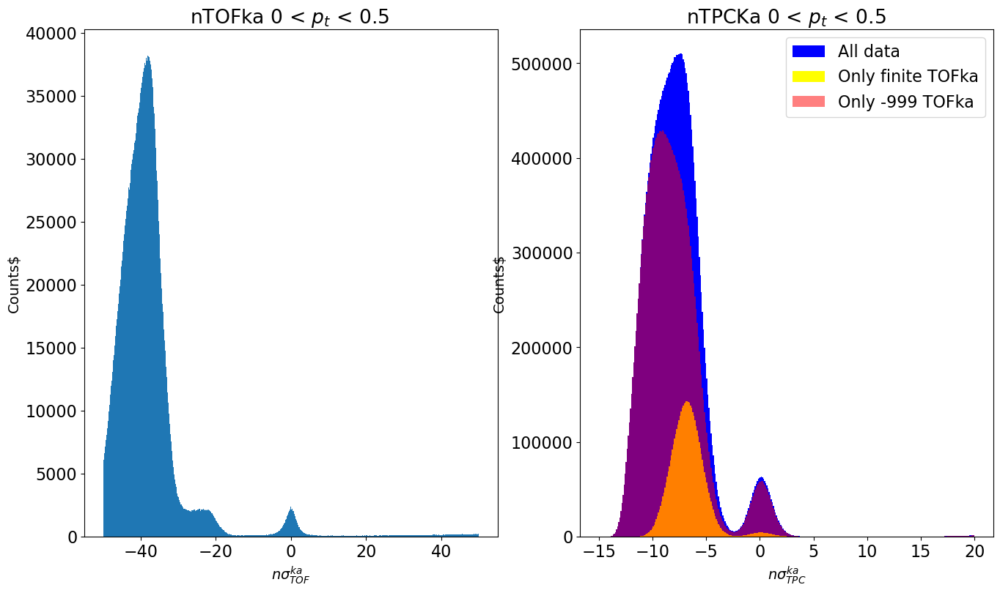

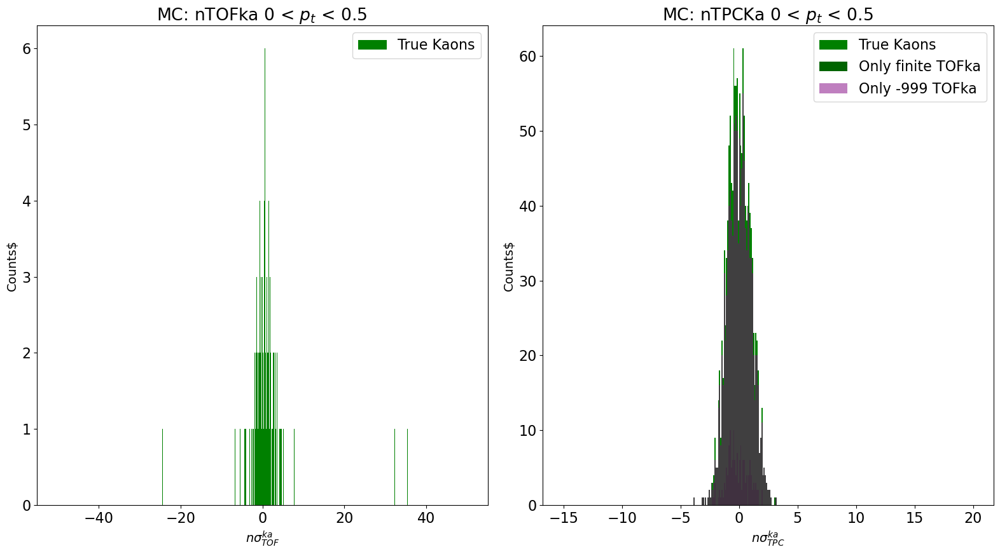

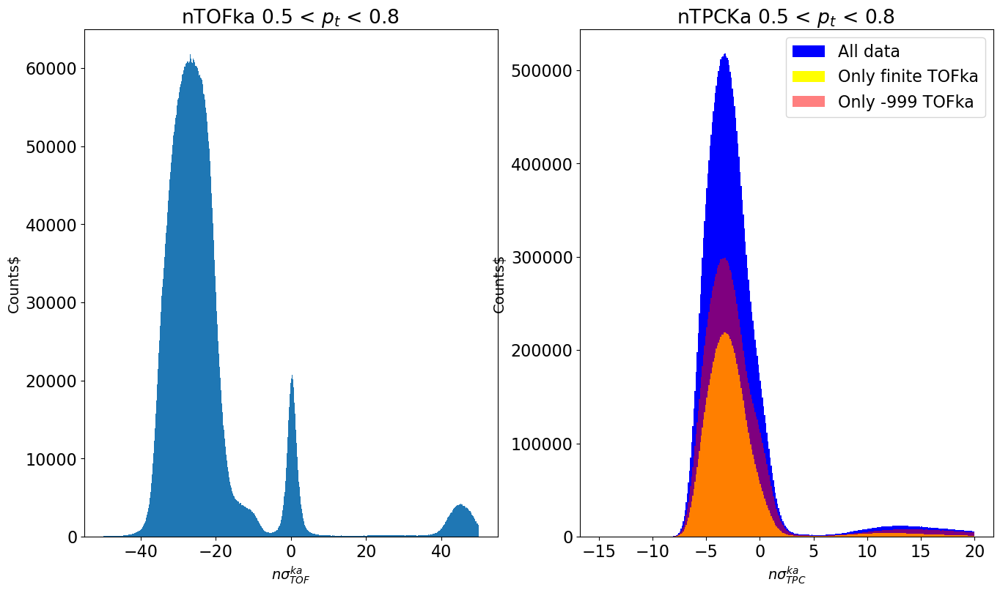

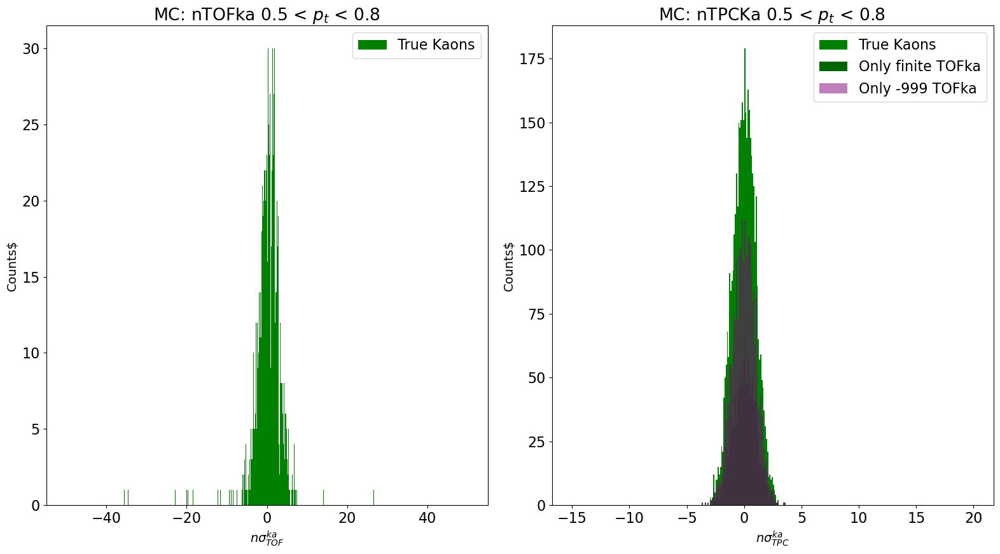

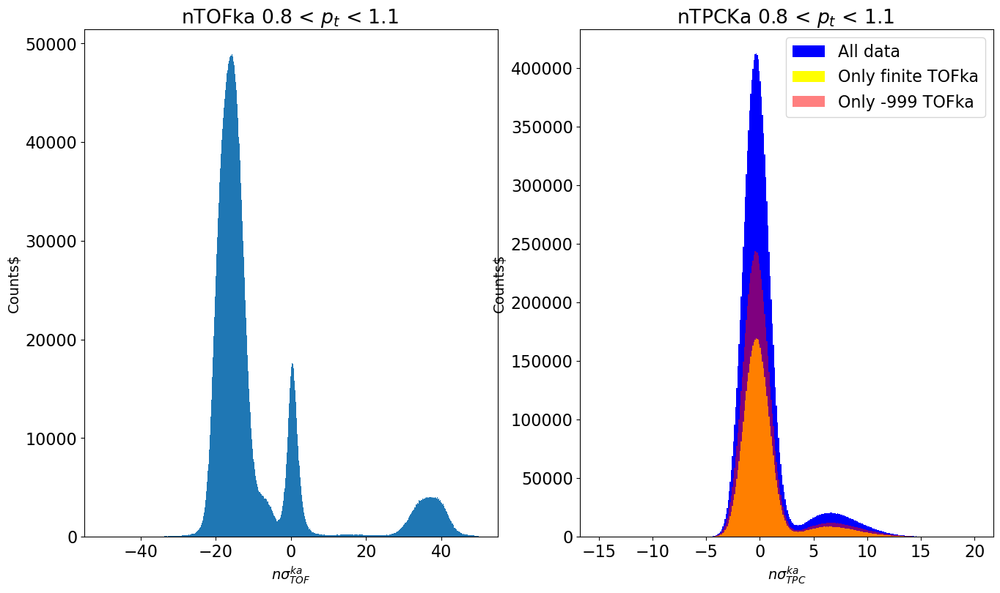

...

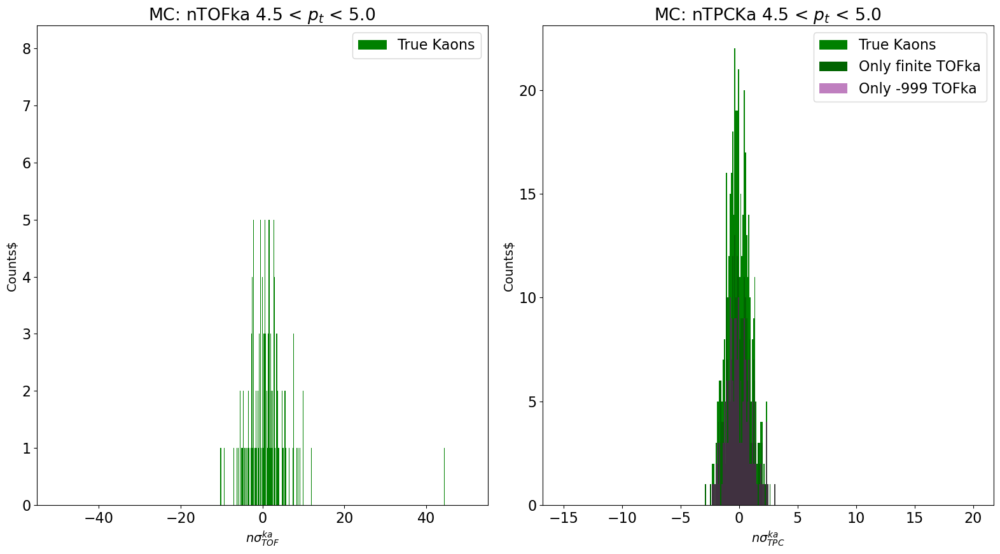

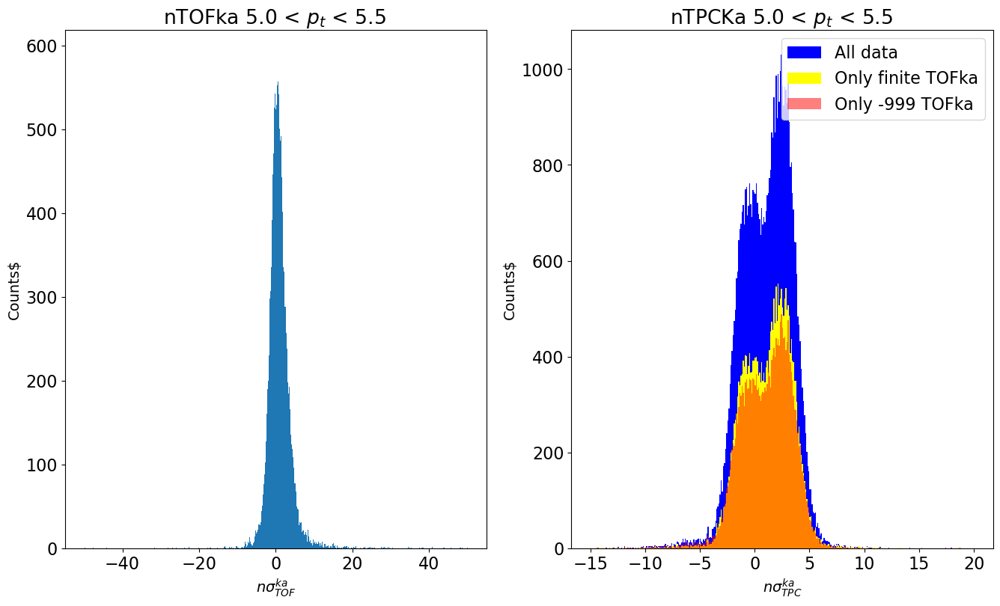

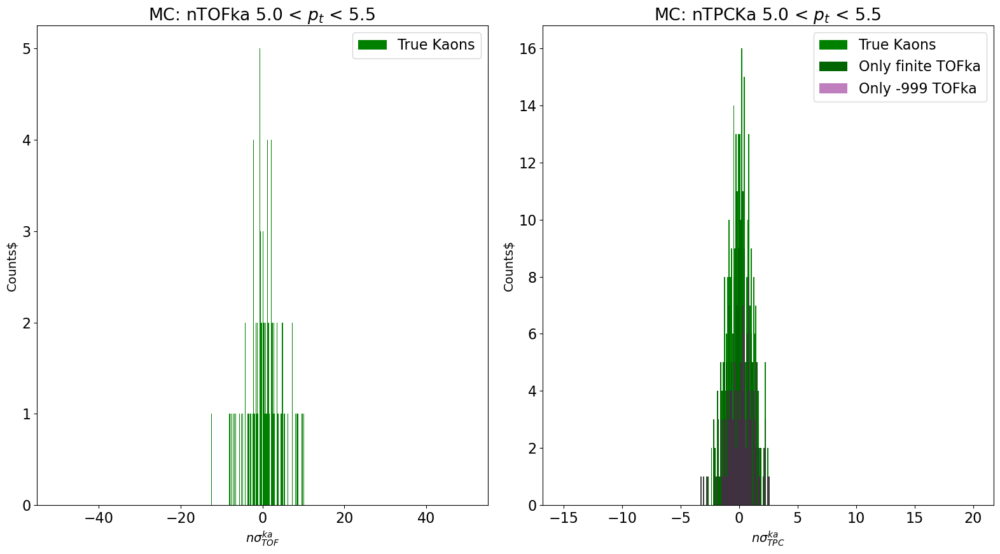

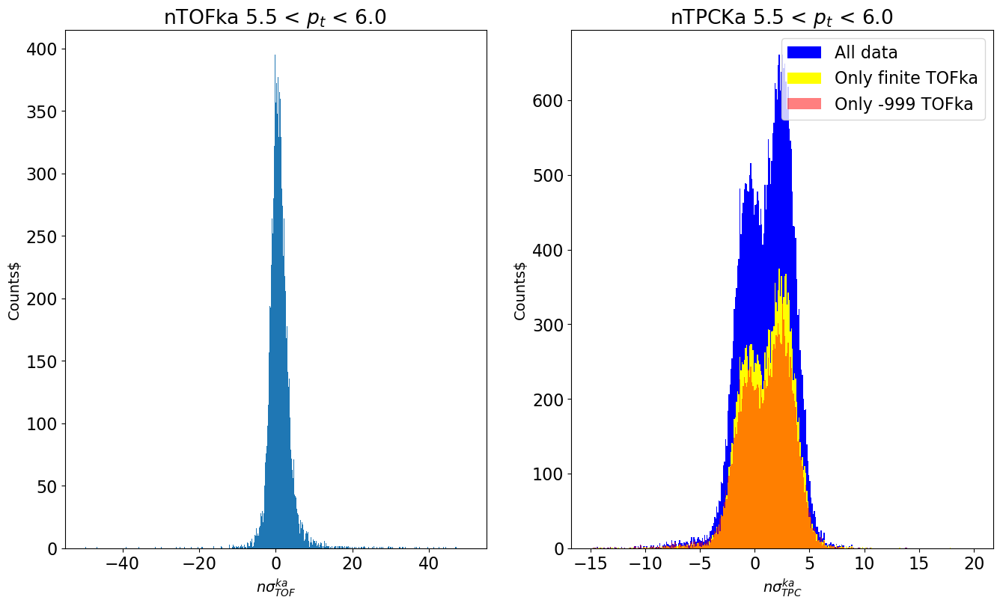

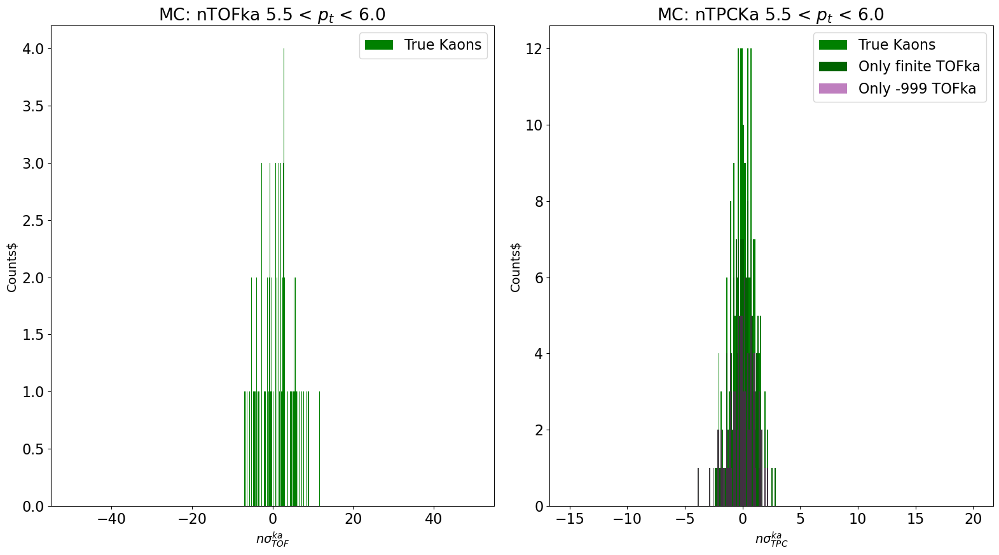

In [10]:
curr_item = 0
bin_width = 0.1
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ][["fNsigmaTOFka", "fNsigmaTPCka"]]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
    ax1.hist(data["fNsigmaTOFka"], range=(-50,50), bins=np.arange(-50,50+bin_width, bin_width) )
    ax1.set_xlabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax1.set_ylabel(r"Counts$", fontsize=fs)
    ax1.set_title(f"nTOFka {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")
     
    ax2.hist(data["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="blue", label="All data")
    ax2.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"Counts$", fontsize=fs)
    ax2.set_title(f"nTPCKa {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    # Does the TPCka change if we only consider those with finite TOFKA?
    ax2.hist(data[data["fNsigmaTOFka"]!=-999]["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="yellow",
             label="Only finite TOFka")
    ax2.hist(data[data["fNsigmaTOFka"]==-999]["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="red",
             label="Only -999 TOFka", alpha = 0.5)
    ax2.legend()

    MC_data = true_kaons[ true_kaons["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ][["fNsigmaTOFka", "fNsigmaTPCka"]]
    
    fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(16,9))
    ax3.hist(MC_data["fNsigmaTOFka"], range=(-50,50), bins=np.arange(-50,50+bin_width, bin_width), color="green", label="True Kaons" )
    ax3.set_xlabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax3.set_ylabel(r"Counts$", fontsize=fs)
    ax3.set_title(f"MC: nTOFka {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")
    ax3.legend()
     
    ax4.hist(MC_data["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="green", label="True Kaons")
    ax4.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"Counts$", fontsize=fs)
    ax4.set_title(f"MC: nTPCKa {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    # Does the TPCka change if we only consider those with finite TOFKA?
    ax4.hist(MC_data[MC_data["fNsigmaTOFka"]!=-999]["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width),
             color="darkgreen", label="Only finite TOFka")
    ax4.hist(MC_data[MC_data["fNsigmaTOFka"]==-999]["fNsigmaTPCka"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width),
             color="purple", label="Only -999 TOFka", alpha=0.5)
    ax4.legend()
    
    curr_item += 1

    plt.tight_layout()
    plt.show()

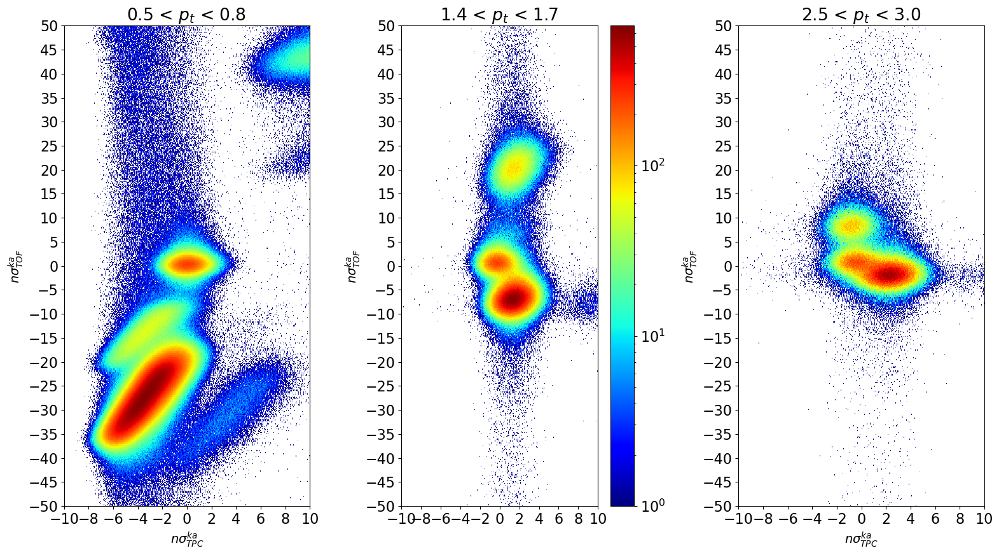

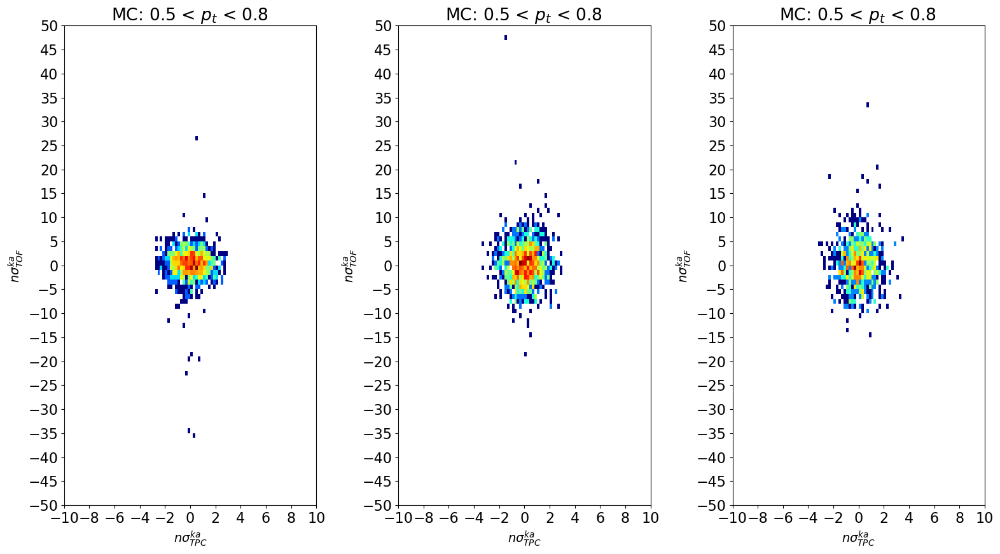

In [11]:
# comparison in one
pt_slices = [ [0.5, 0.8], [1.4, 1.7], [2.5, 3.0]
            ]
curr_item = 0
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    MC_data = true_kaons [ true_kaons["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax1, ax2, axa) = plt.subplots(1, 3, figsize=(16,9))
    h = ax1.hist2d(data["fNsigmaTPCka"],data["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(h[3], ax=ax1)
    ax1.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax1.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax1.set_xlim(-10,10)
    ax1.set_xticks(np.arange(-10,10+2,2))
    ax1.set_ylim(-50,50)
    ax1.set_yticks(np.arange(-50,50+5,5))
    ax1.set_title(f"{pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h2 = ax2.hist2d(data["fNsigmaTPCka"], data["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    fig.colorbar(h2[3], ax=ax2)
    #ax2.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax2.set_xlim(-10,10)
    ax2.set_xticks(np.arange(-10,10+2,2))
    ax2.set_ylim(-50,50)
    ax2.set_yticks(np.arange(-50,50+5,5))
    ax2.set_title(f"{pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+2][0], pt_slices[curr_item+2][1]) ]
     
    ha = axa.hist2d(data["fNsigmaTPCka"], data["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    #fig.colorbar(ha[3], ax=axa)
    axa.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    axa.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    axa.set_xlim(-10,10)
    axa.set_xticks(np.arange(-10,10+2,2))
    axa.set_ylim(-50,50)
    axa.set_yticks(np.arange(-50,50+5,5))
    axa.set_title(f"{pt_slices[curr_item+2][0]} < $p_t$ < {pt_slices[curr_item+2][1]} ")

    plt.tight_layout()
    plt.savefig("RealDataTOFvsTPCperPt.png")
    plt.show()

    fig, (ax3, ax4, axb) = plt.subplots(1, 3, figsize=(16,9))
    h3 = ax3.hist2d(MC_data["fNsigmaTPCka"],MC_data["fNsigmaTOFka"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(h3[3], ax=ax3)
    ax3.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax3.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax3.set_xlim(-10,10)
    ax3.set_xticks(np.arange(-10,10+2,2))
    ax3.set_ylim(-50,50)
    ax3.set_yticks(np.arange(-50,50+5,5))
    ax3.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    MC_data = true_kaons[ true_kaons["pt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]

    h4 = ax4.hist2d(MC_data["fNsigmaTPCka"],MC_data["fNsigmaTOFka"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(h4[3], ax=ax4)
    ax4.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    ax4.set_xlim(-10,10)
    ax4.set_xticks(np.arange(-10,10+2,2))
    ax4.set_ylim(-50,50)
    ax4.set_yticks(np.arange(-50,50+5,5))
    ax4.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    MC_data = true_kaons[ true_kaons["pt"].between(pt_slices[curr_item+2][0], pt_slices[curr_item+2][1]) ]

    hb = axb.hist2d(MC_data["fNsigmaTPCka"],MC_data["fNsigmaTOFka"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(hb[3], ax=axb)
    axb.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
    axb.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
    axb.set_xlim(-10,10)
    axb.set_xticks(np.arange(-10,10+2,2))
    axb.set_ylim(-50,50)
    axb.set_yticks(np.arange(-50,50+5,5))
    axb.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    plt.tight_layout()
    plt.savefig("MCDataTOFvsTPCperPt.png")
    plt.show()

    curr_item += 3

## Real data: TOFpi and TPCpi

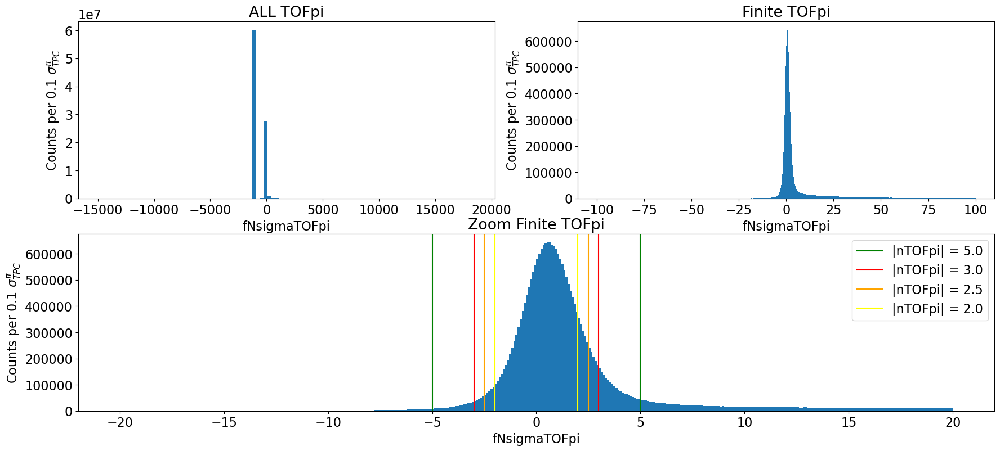

Unavailable TOFpi: 67.60%
TOFpi distribution in % (These are referred to the portion of data whose TOFpi is not -999)


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Finite TOFpi,19.35,36.4,49.85,59.58,66.22,70.63,75.52,77.96,80.51,82.7
% of Total,6.27,11.79,16.15,19.3,21.46,22.89,24.47,25.26,26.09,26.8


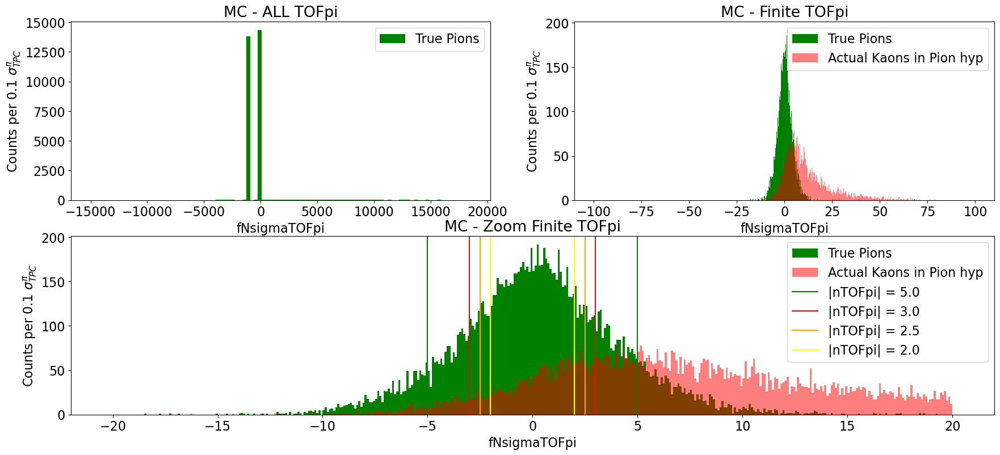

Unavailable TOFpi: 46.55%
TOFpi distribution in % (These are referred to the portion of data whose TOFpi is not -999)


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Finite TOFpi in MC,10.8,21.23,30.95,39.84,47.44,54.27,65.35,73.72,83.78,89.06
% of Total,5.77,11.35,16.54,21.3,25.36,29.01,34.94,39.41,44.78,47.61


In [12]:
N_BINS = 100
bin_width = 0.1

mosaic = [
    ["ALL TOFpi", "Finite TOFpi"],
    ["Finite ZOOM TOFpi", "Finite ZOOM TOFpi"]
]


fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

NA_TOFpi_mask = real_data["fNsigmaTOFpi"] == -999

axes["ALL TOFpi"].hist(real_data["fNsigmaTOFpi"], bins=N_BINS)
axes["ALL TOFpi"].set_title("ALL TOFpi")
axes["ALL TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["ALL TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")

axes["Finite TOFpi"].hist(real_data[~NA_TOFpi_mask]["fNsigmaTOFpi"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width))
axes["Finite TOFpi"].set_title("Finite TOFpi")
axes["Finite TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["Finite TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")

axes["Finite ZOOM TOFpi"].hist(real_data[~NA_TOFpi_mask]["fNsigmaTOFpi"], range=(-20,20), bins=np.arange(-20,20+bin_width, bin_width))
axes["Finite ZOOM TOFpi"].set_title("Zoom Finite TOFpi")
axes["Finite ZOOM TOFpi"].axvline(x=-5, color="green", label="|nTOFpi| = 5.0")
axes["Finite ZOOM TOFpi"].axvline(x=+5, color="green")
axes["Finite ZOOM TOFpi"].axvline(x=-3, color="red", label="|nTOFpi| = 3.0")
axes["Finite ZOOM TOFpi"].axvline(x=+3, color="red")
axes["Finite ZOOM TOFpi"].axvline(x=-2.5, color="orange", label="|nTOFpi| = 2.5")
axes["Finite ZOOM TOFpi"].axvline(x=+2.5, color="orange")
axes["Finite ZOOM TOFpi"].axvline(x=-2.0, color="yellow", label="|nTOFpi| = 2.0")
axes["Finite ZOOM TOFpi"].axvline(x=+2.0, color="yellow")
axes["Finite ZOOM TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["Finite ZOOM TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
plt.legend()

plt.show()

tot = len(real_data)
tot_NA_TOFpi = np.sum(NA_TOFpi_mask)
tot_finite_TOFpi = tot - tot_NA_TOFpi
print(f"Unavailable TOFpi: {tot_NA_TOFpi/tot*100:.2f}%")

TOFpi_slice = [ [-0.5,0.5], [-1, 1], [-1.5,1.5], [-2.0,2.0], [-2.5, 2.5], [-3.0, 3.0], [-4.0, 4.0], [-5, 5], [-7,7], [-10,10] ]
TOFpi_bucket = []
for i in range (len(TOFpi_slice)):
    TOFpi_lim = TOFpi_slice[i]
    TOFpi_bucket.append( np.sum(real_data["fNsigmaTOFpi"].between(TOFpi_lim[0], TOFpi_lim[1]))/tot_finite_TOFpi )
TOFpi_recap = pd.DataFrame(columns=[str(item) for item in TOFpi_slice], index=["% of Finite TOFpi", "% of Total"])
TOFpi_recap.loc["% of Finite TOFpi"] = TOFpi_bucket
TOFpi_recap.loc["% of Total"] = np.array(TOFpi_bucket)*tot_finite_TOFpi/tot
pd.set_option("display.precision", 2)
print("TOFpi distribution in % (These are referred to the portion of data whose TOFpi is not -999)")
display(TOFpi_recap*100)

mosaic = [
    ["ALL TOFpi", "Finite TOFpi"],
    ["Finite ZOOM TOFpi", "Finite ZOOM TOFpi"]
]


fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

MC_NA_TOFpi_mask = true_pions["fNsigmaTOFpi"] == -999
MC_NA_TOFpi_mask_refl = true_kaons["fNsigmaTOFpi"] == -999

axes["ALL TOFpi"].hist(true_pions["fNsigmaTOFpi"], bins=N_BINS, color="green", label="True Pions", range=(np.min(real_data["fNsigmaTOFpi"]),
                                                                                                         np.max(real_data["fNsigmaTOFpi"])))
axes["ALL TOFpi"].set_title("MC - ALL TOFpi")
axes["ALL TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["ALL TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
axes["ALL TOFpi"].legend()

axes["Finite TOFpi"].hist(true_pions[~MC_NA_TOFpi_mask]["fNsigmaTOFpi"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width),
                          color="green", label = "True Pions")
axes["Finite TOFpi"].hist(true_kaons[~MC_NA_TOFpi_mask_refl]["fNsigmaTOFpi"], range=(-100,100), bins=np.arange(-100, 100+bin_width, bin_width),
                          color="red", label = "Actual Kaons in Pion hyp", alpha=0.5)
axes["Finite TOFpi"].set_title("MC - Finite TOFpi")
axes["Finite TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["Finite TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
axes["Finite TOFpi"].legend()

axes["Finite ZOOM TOFpi"].hist(true_pions[~MC_NA_TOFpi_mask]["fNsigmaTOFpi"], range=(-20,20), bins=np.arange(-20,20+bin_width, bin_width),
                              color = "green", label="True Pions")
axes["Finite ZOOM TOFpi"].hist(true_kaons[~MC_NA_TOFpi_mask_refl]["fNsigmaTOFpi"], range=(-20,20), bins=np.arange(-20, 20+bin_width, bin_width),
                          color="red", label = "Actual Kaons in Pion hyp", alpha=0.5)
axes["Finite ZOOM TOFpi"].set_title("MC - Zoom Finite TOFpi")
axes["Finite ZOOM TOFpi"].axvline(x=-5, color="green", label="|nTOFpi| = 5.0")
axes["Finite ZOOM TOFpi"].axvline(x=+5, color="green")
axes["Finite ZOOM TOFpi"].axvline(x=-3, color="red", label="|nTOFpi| = 3.0")
axes["Finite ZOOM TOFpi"].axvline(x=+3, color="red")
axes["Finite ZOOM TOFpi"].axvline(x=-2.5, color="orange", label="|nTOFpi| = 2.5")
axes["Finite ZOOM TOFpi"].axvline(x=+2.5, color="orange")
axes["Finite ZOOM TOFpi"].axvline(x=-2.0, color="yellow", label="|nTOFpi| = 2.0")
axes["Finite ZOOM TOFpi"].axvline(x=+2.0, color="yellow")
axes["Finite ZOOM TOFpi"].set_xlabel("fNsigmaTOFpi")
axes["Finite ZOOM TOFpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
plt.legend()

plt.show()

MC_tot = len(true_pions)
MC_tot_NA_TOFpi = np.sum(MC_NA_TOFpi_mask)
MC_tot_finite_TOFpi = MC_tot - MC_tot_NA_TOFpi
print(f"Unavailable TOFpi: {MC_tot_NA_TOFpi/MC_tot*100:.2f}%")

MC_TOFpi_bucket = []
for i in range (len(TOFpi_slice)):
    TOFpi_lim = TOFpi_slice[i]
    MC_TOFpi_bucket.append( np.sum(true_pions["fNsigmaTOFpi"].between(TOFpi_lim[0], TOFpi_lim[1]))/MC_tot_finite_TOFpi )
MC_TOFpi_recap = pd.DataFrame(columns=[str(item) for item in TOFpi_slice], index=["% of Finite TOFpi in MC", "% of Total"])
MC_TOFpi_recap.loc["% of Finite TOFpi in MC"] = MC_TOFpi_bucket
MC_TOFpi_recap.loc["% of Total"] = np.array(MC_TOFpi_bucket)*MC_tot_finite_TOFpi/MC_tot
pd.set_option("display.precision", 2)
print("TOFpi distribution in % (These are referred to the portion of data whose TOFpi is not -999)")
display(MC_TOFpi_recap*100)

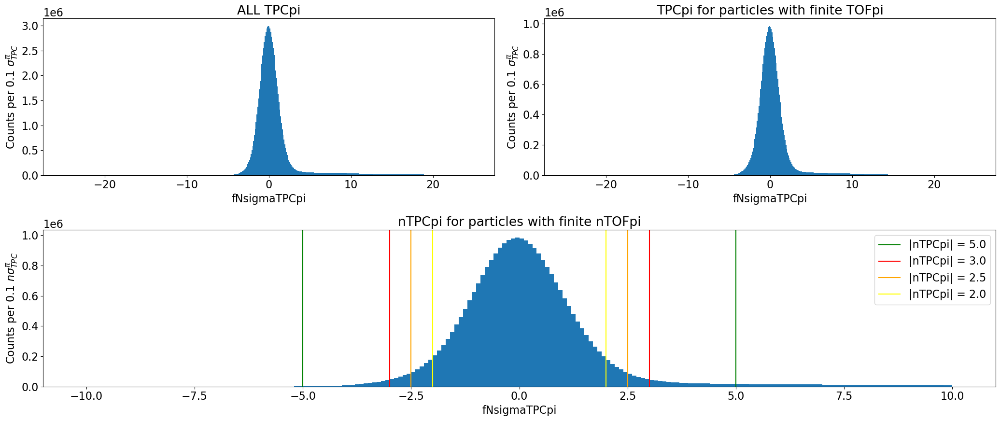

TPCpi distribution in %


,"[-0.5, 0.5]","[-1, 1]","[-1.5, 1.5]","[-2.0, 2.0]","[-2.5, 2.5]","[-3.0, 3.0]","[-4.0, 4.0]","[-5, 5]","[-7, 7]","[-10, 10]"
% of Total,32.35,58.37,75.32,84.5,88.88,90.94,92.61,93.38,94.49,95.93


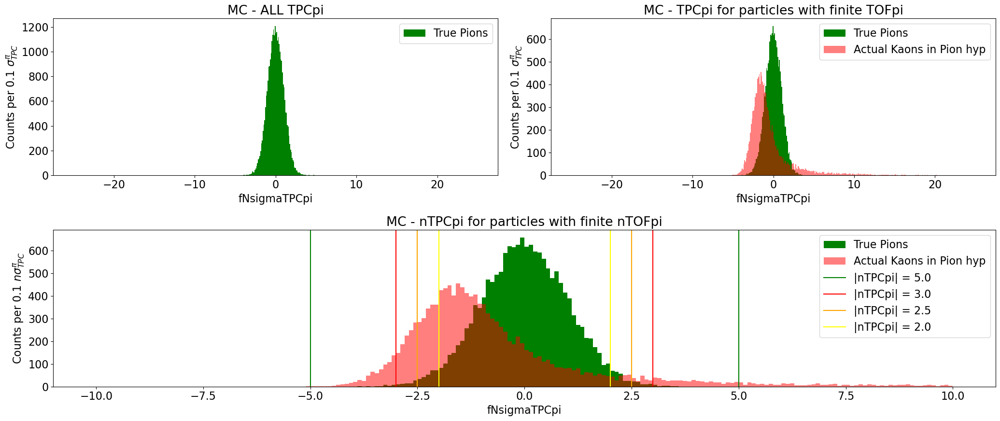

In [13]:
# I fix the bin width instead of number of bins for an easier comparison between the various graphs
bin_width = 0.1

mosaic = [
    ["ALL TPCpi", "Finite TPCpi"],
    ["ZOOM TPCpi", "ZOOM TPCpi"]
]

fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

axes["ALL TPCpi"].hist(real_data["fNsigmaTPCpi"],range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ) )
axes["ALL TPCpi"].set_title("ALL TPCpi")
axes["ALL TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["ALL TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")

axes["Finite TPCpi"].hist(real_data[~NA_TOFpi_mask]["fNsigmaTPCpi"], range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ))
axes["Finite TPCpi"].set_title("TPCpi for particles with finite TOFpi")
axes["Finite TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["Finite TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")

axes["ZOOM TPCpi"].hist(real_data[~NA_TOFpi_mask]["fNsigmaTPCpi"], range=(-10,10), bins=np.arange(-10,10+bin_width, bin_width ))
axes["ZOOM TPCpi"].set_title("nTPCpi for particles with finite nTOFpi")
axes["ZOOM TPCpi"].axvline(x=-5, color="green", label="|nTPCpi| = 5.0")
axes["ZOOM TPCpi"].axvline(x=+5, color="green")
axes["ZOOM TPCpi"].axvline(x=-3, color="red", label="|nTPCpi| = 3.0")
axes["ZOOM TPCpi"].axvline(x=+3, color="red")
axes["ZOOM TPCpi"].axvline(x=-2.5, color="orange", label="|nTPCpi| = 2.5")
axes["ZOOM TPCpi"].axvline(x=+2.5, color="orange")
axes["ZOOM TPCpi"].axvline(x=-2.0, color="yellow", label="|nTPCpi| = 2.0")
axes["ZOOM TPCpi"].axvline(x=+2.0, color="yellow")
axes["ZOOM TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["ZOOM TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$n\sigma_{TPC}^{\pi}$")
plt.legend()

plt.tight_layout()
plt.savefig("RealDataTPCPi.png")
plt.show()

TPCpi_slice = [ [-0.5,0.5], [-1, 1], [-1.5,1.5], [-2.0,2.0], [-2.5, 2.5], [-3.0, 3.0], [-4.0, 4.0], [-5, 5], [-7,7], [-10,10] ]
TPCpi_bucket = []
for i in range (len(TPCpi_slice)):
    TPCpi_lim = TPCpi_slice[i]
    TPCpi_bucket.append( np.sum(real_data["fNsigmaTPCpi"].between(TPCpi_lim[0], TPCpi_lim[1]))/tot)
TPCpi_recap = pd.DataFrame(columns=[str(item) for item in TOFpi_slice], index=["% of Total"])
TPCpi_recap.loc["% of Total"] = TPCpi_bucket
pd.set_option("display.precision", 2)
print("TPCpi distribution in %")
display(TPCpi_recap*100)

mosaic = [
    ["ALL TPCpi", "Finite TPCpi"],
    ["ZOOM TPCpi", "ZOOM TPCpi"]
]

fig, axes = plt.subplot_mosaic(mosaic, figsize=(21, 9))

axes["ALL TPCpi"].hist(true_pions["fNsigmaTPCpi"],range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ), color="green", label="True Pions" )
axes["ALL TPCpi"].set_title("MC - ALL TPCpi")
axes["ALL TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["ALL TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
axes["ALL TPCpi"].legend()

axes["Finite TPCpi"].hist(true_pions[~MC_NA_TOFpi_mask]["fNsigmaTPCpi"], range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ),
                          color="green", label="True Pions")
axes["Finite TPCpi"].hist(true_kaons[~MC_NA_TOFpi_mask_refl]["fNsigmaTPCpi"], range=(-25,25), bins=np.arange(-25,25+bin_width, bin_width ),
                          color="red", label="Actual Kaons in Pion hyp", alpha = 0.5)
axes["Finite TPCpi"].set_title("MC - TPCpi for particles with finite TOFpi")
axes["Finite TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["Finite TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$\sigma_{TPC}^{\pi}$")
axes["Finite TPCpi"].legend()

axes["ZOOM TPCpi"].hist(true_pions[~MC_NA_TOFpi_mask]["fNsigmaTPCpi"], range=(-10,10), bins=np.arange(-10,10+bin_width, bin_width ),
                        color="green", label="True Pions")
axes["ZOOM TPCpi"].hist(true_kaons[~MC_NA_TOFpi_mask_refl]["fNsigmaTPCpi"], range=(-10,10), bins=np.arange(-10,10+bin_width, bin_width ),
                        color="red", label="Actual Kaons in Pion hyp", alpha = 0.5)
axes["ZOOM TPCpi"].set_title("MC - nTPCpi for particles with finite nTOFpi")
axes["ZOOM TPCpi"].axvline(x=-5, color="green", label="|nTPCpi| = 5.0")
axes["ZOOM TPCpi"].axvline(x=+5, color="green")
axes["ZOOM TPCpi"].axvline(x=-3, color="red", label="|nTPCpi| = 3.0")
axes["ZOOM TPCpi"].axvline(x=+3, color="red")
axes["ZOOM TPCpi"].axvline(x=-2.5, color="orange", label="|nTPCpi| = 2.5")
axes["ZOOM TPCpi"].axvline(x=+2.5, color="orange")
axes["ZOOM TPCpi"].axvline(x=-2.0, color="yellow", label="|nTPCpi| = 2.0")
axes["ZOOM TPCpi"].axvline(x=+2.0, color="yellow")
axes["ZOOM TPCpi"].set_xlabel("fNsigmaTPCpi")
axes["ZOOM TPCpi"].set_ylabel(f"Counts per {bin_width} " + r"$n\sigma_{TPC}^{\pi}$")
plt.legend()

plt.tight_layout()
plt.savefig("MCDataTPCPi.png")
plt.show()

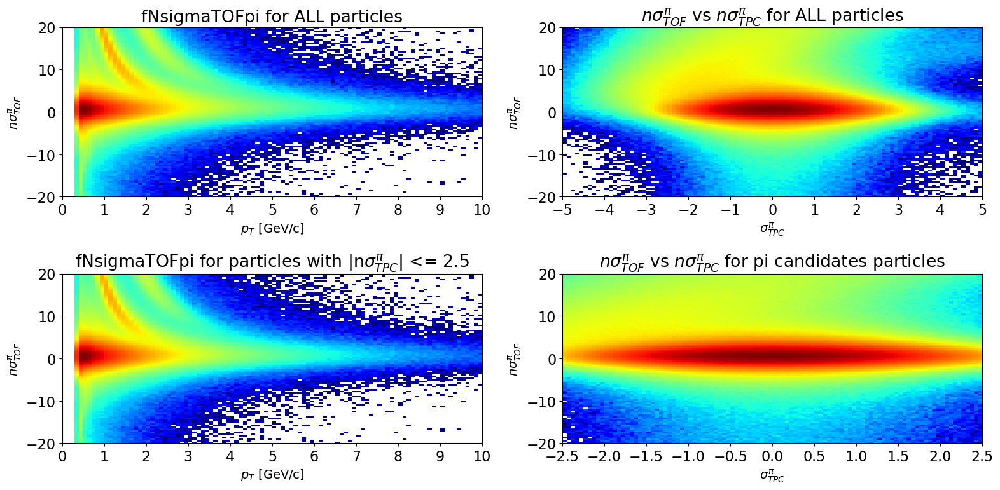

In [14]:
min_cut_TOF_PI, max_cut_TOF_PI = -20.0, 20.0
min_cut_TPC_PI, max_cut_TPC_PI = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(real_data["fPt"], real_data["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title("fNsigmaTOFpi for ALL particles")

axes["top right"].hist2d(real_data["fNsigmaTPCpi"], real_data["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_PI,max_cut_TPC_PI],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_PI, max_cut_TPC_PI )
axes["top right"].set_xticks(np.arange(min_cut_TPC_PI, max_cut_TPC_PI+1, 1) )
axes["top right"].set_title(r"$n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for ALL particles")

# Let's see for those that are more likely to be actual Kaons
TPCpi_cut = 2.5
TPC_pi_mask = real_data["fNsigmaTPCpi"].abs() <= TPCpi_cut

axes["bot left"].hist2d(real_data[TPC_pi_mask]["fPt"], real_data[TPC_pi_mask]["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title(r"fNsigmaTOFpi for particles with |n$\sigma^{\pi}_{TPC}$| <= " + f"{TPCpi_cut:.1f}")

axes["bot right"].hist2d(real_data[TPC_pi_mask]["fNsigmaTPCpi"], real_data[TPC_pi_mask]["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[-TPCpi_cut,+TPCpi_cut],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(-TPCpi_cut, +TPCpi_cut )
axes["bot right"].set_xticks(np.arange(-TPCpi_cut, TPCpi_cut+0.5, 0.5) )
axes["bot right"].set_title(r"$n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for pi candidates particles")
# axes["bot right"].axhline(y=-5, color="green", label="|nTOFpi| = 5.0")
# axes["bot right"].axhline(y=+5, color="green")
# axes["bot right"].axhline(y=-3, color="red", label="|nTOFpi| = 3.0")
# axes["bot right"].axhline(y=+3, color="red", label="|nTOFpi| = 3.0")

plt.tight_layout()
plt.show()

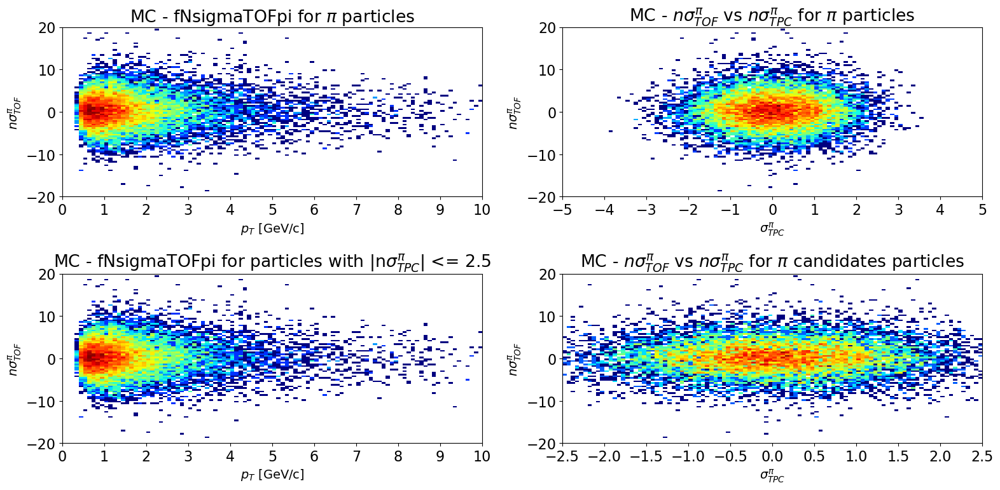

In [15]:
min_cut_TOF_PI, max_cut_TOF_PI = -20.0, 20.0
min_cut_TPC_PI, max_cut_TPC_PI = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(true_pions["pt"], true_pions["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title(r"MC - fNsigmaTOFpi for ${\pi}$ particles")

axes["top right"].hist2d(true_pions["fNsigmaTPCpi"], true_pions["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_PI,max_cut_TPC_PI],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_PI, max_cut_TPC_PI )
axes["top right"].set_xticks(np.arange(min_cut_TPC_PI, max_cut_TPC_PI+1, 1) )
axes["top right"].set_title(r"MC - $n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for ${\pi}$ particles")

# Let's see for those that are more likely to be actual Kaons
TPCpi_cut = 2.5
MC_TPC_pi_mask = true_pions["fNsigmaTPCpi"].abs() <= TPCpi_cut

axes["bot left"].hist2d(true_pions[MC_TPC_pi_mask]["pt"], true_pions[MC_TPC_pi_mask]["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title(r"MC - fNsigmaTOFpi for particles with |n$\sigma^{\pi}_{TPC}$| <= " + f"{TPCpi_cut:.1f}")

axes["bot right"].hist2d(true_pions[MC_TPC_pi_mask]["fNsigmaTPCpi"], true_pions[MC_TPC_pi_mask]["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[-TPCpi_cut,+TPCpi_cut],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(-TPCpi_cut, +TPCpi_cut )
axes["bot right"].set_xticks(np.arange(-TPCpi_cut, TPCpi_cut+0.5, 0.5) )
axes["bot right"].set_title(r"MC - $n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for ${\pi}$ candidates particles")
# axes["bot right"].axhline(y=-5, color="green", label="|nTOFpi| = 5.0")
# axes["bot right"].axhline(y=+5, color="green")
# axes["bot right"].axhline(y=-3, color="red", label="|nTOFpi| = 3.0")
# axes["bot right"].axhline(y=+3, color="red", label="|nTOFpi| = 3.0")

plt.tight_layout()
plt.show()

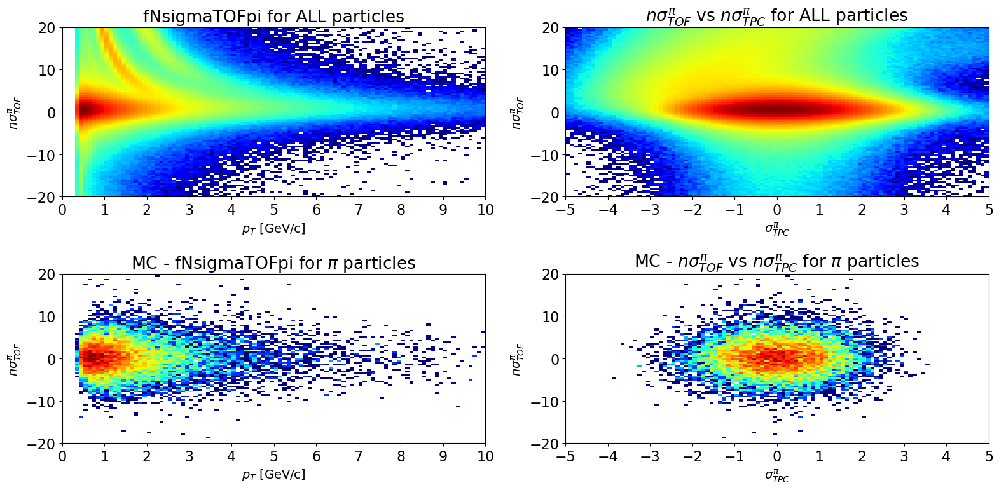

In [16]:
# comparison in one
min_cut_TOF_PI, max_cut_TOF_PI = -20.0, 20.0
min_cut_TPC_PI, max_cut_TPC_PI = -5.0, 5.0
p_cut_lower, p_cut_upper = 0, 10

mosaic = [ ["top left", "top right"],
           ["bot left", "bot right"]
         ]

fs = 14
p_cut_lower = 0
p_cut_upper = 10
fig, axes = plt.subplot_mosaic(mosaic, figsize=(16, 8))
axes["top left"].hist2d(real_data["fPt"], real_data["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["top left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top left"].set_xlim(p_cut_lower, p_cut_upper )
axes["top left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["top left"].set_title("fNsigmaTOFpi for ALL particles")

axes["top right"].hist2d(real_data["fNsigmaTPCpi"], real_data["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_PI,max_cut_TPC_PI],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["top right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["top right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["top right"].set_xlim(min_cut_TPC_PI, max_cut_TPC_PI )
axes["top right"].set_xticks(np.arange(min_cut_TPC_PI, max_cut_TPC_PI+1, 1) )
axes["top right"].set_title(r"$n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for ALL particles")

axes["bot left"].hist2d(true_pions["pt"], true_pions["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[p_cut_lower,p_cut_upper],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot left"].set_xlabel(r"$p_{T}$ [GeV/c]", fontsize=fs)
axes["bot left"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot left"].set_xlim(p_cut_lower, p_cut_upper )
axes["bot left"].set_xticks(np.arange(p_cut_lower, p_cut_upper+1, 1) )
axes["bot left"].set_title(r"MC - fNsigmaTOFpi for ${\pi}$ particles")

axes["bot right"].hist2d(true_pions["fNsigmaTPCpi"], true_pions["fNsigmaTOFpi"] , (100, 100), cmap="jet", norm=LogNorm(),
                    range = ([[min_cut_TPC_PI,max_cut_TPC_PI],[min_cut_TOF_PI,max_cut_TOF_PI]]))
# plt.colorbar(ax=axes["top"])
axes["bot right"].set_xlabel(r"$\sigma^{\pi}_{TPC}$", fontsize=fs)
axes["bot right"].set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
axes["bot right"].set_xlim(min_cut_TPC_PI, max_cut_TPC_PI )
axes["bot right"].set_xticks(np.arange(min_cut_TPC_PI, max_cut_TPC_PI+1, 1) )
axes["bot right"].set_title(r"MC - $n\sigma^{\pi}_{TOF}$ vs $n\sigma^{\pi}_{TPC}$ for ${\pi}$ particles")
plt.tight_layout()
plt.savefig("ComparisonTOFPi.png")
plt.show()

## Real data: TOFpi and TPCpi, now in pt_slice (This is the pt of the unknown daughter particle)

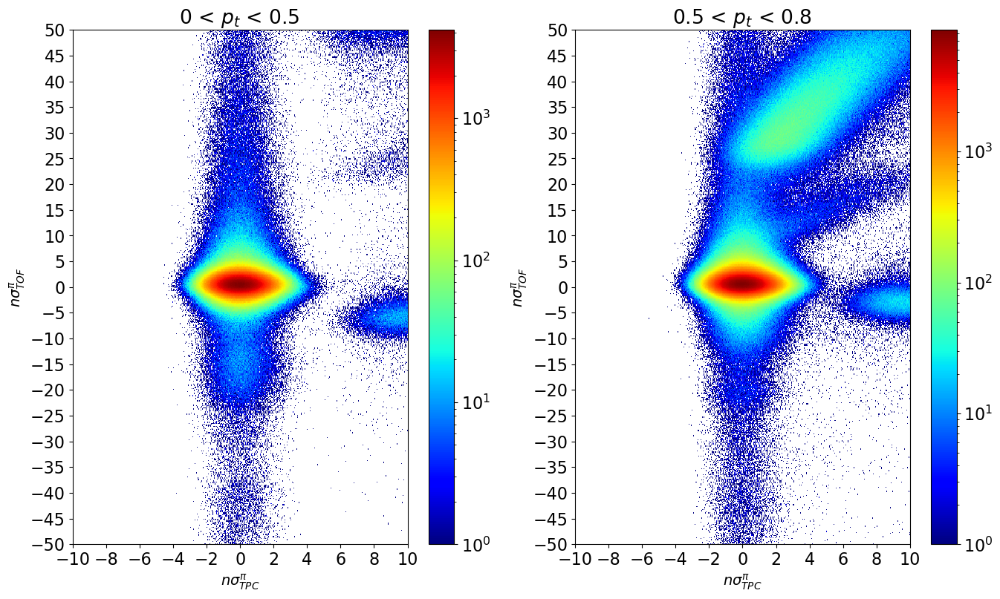

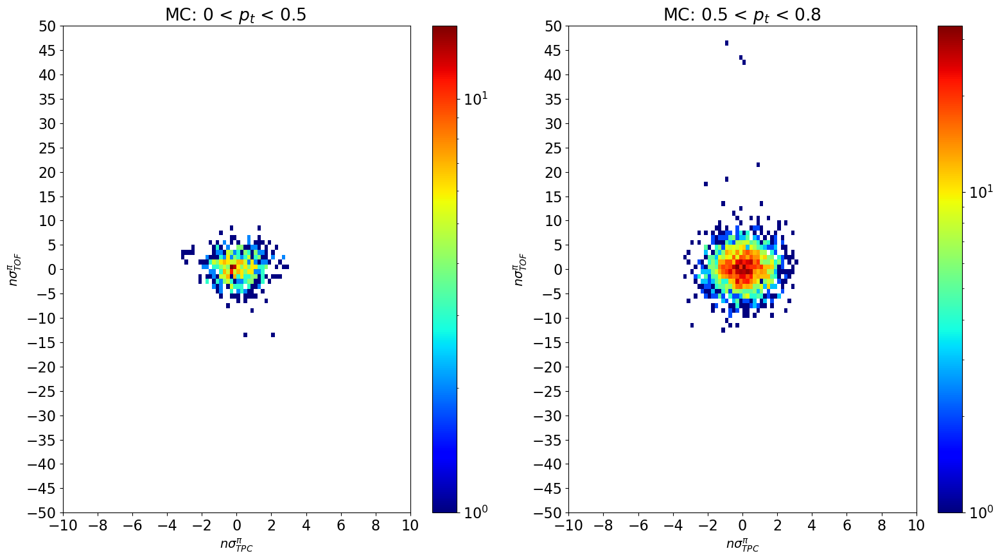

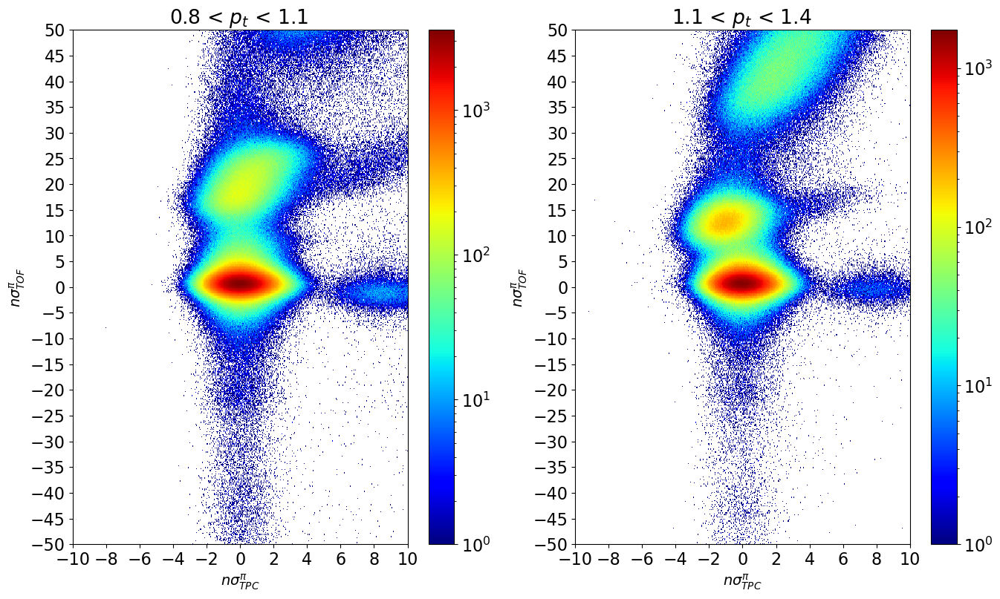

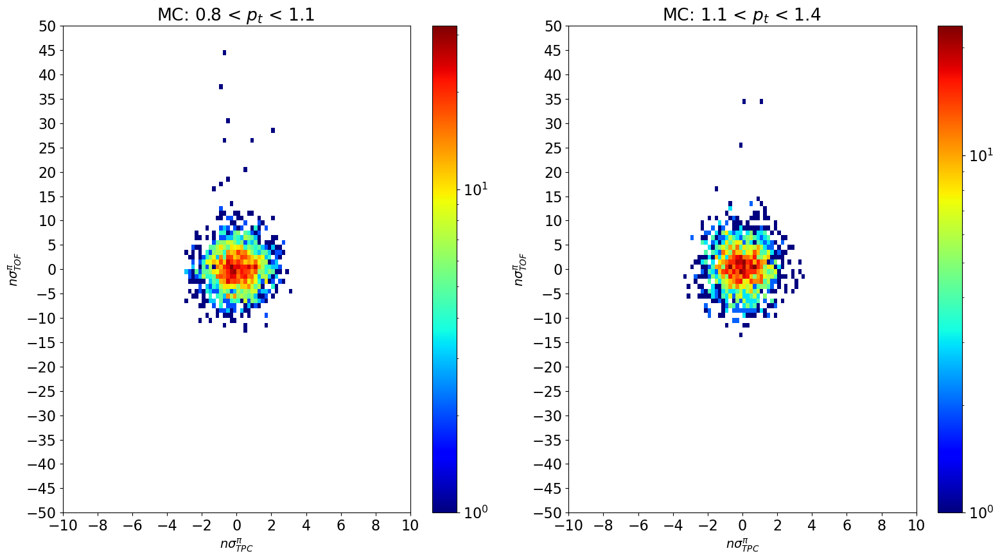

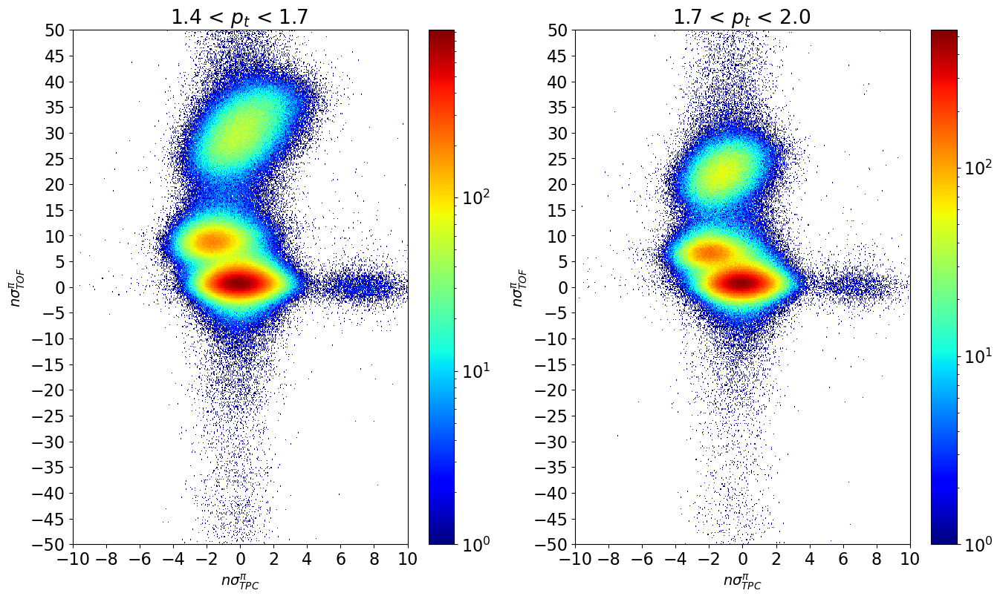

...

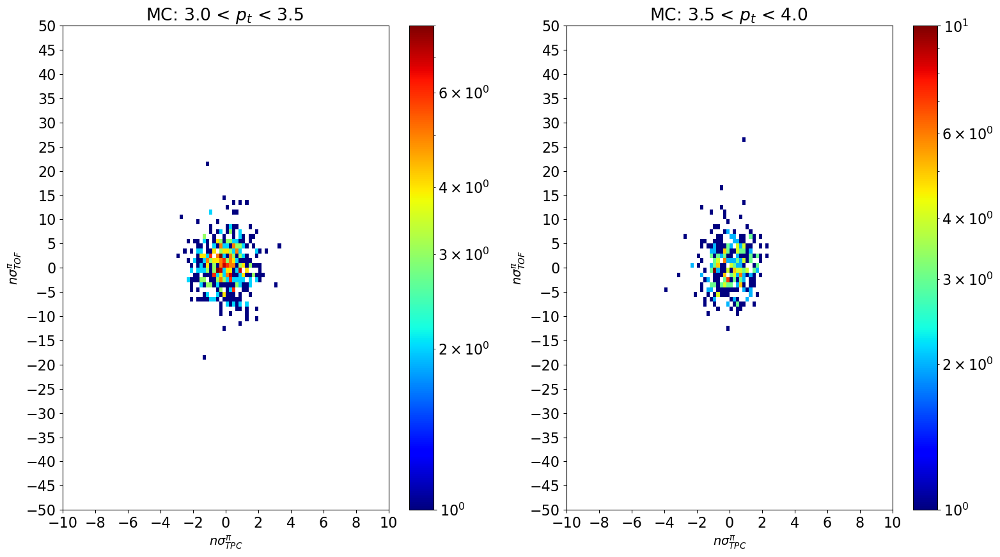

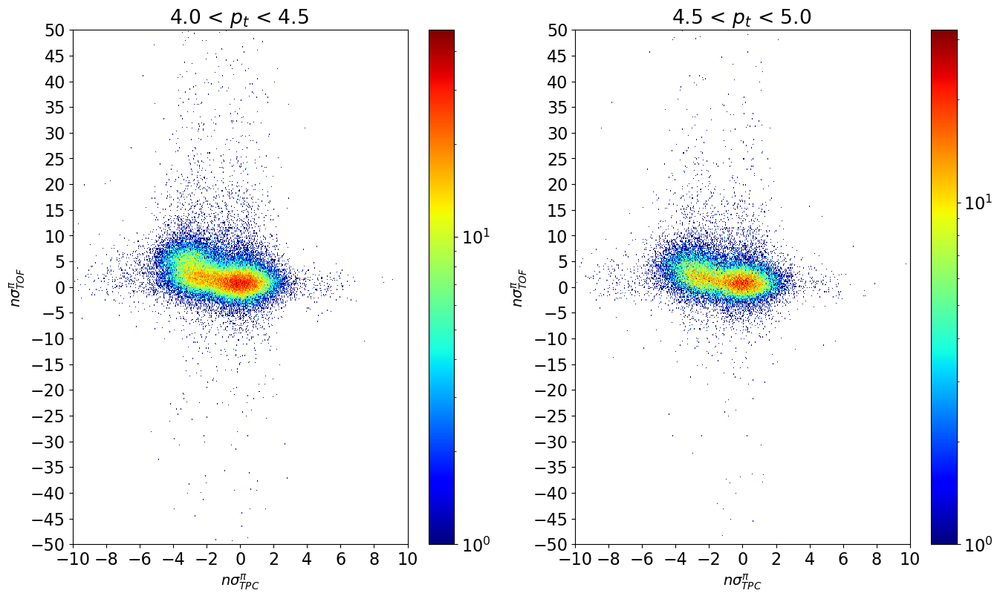

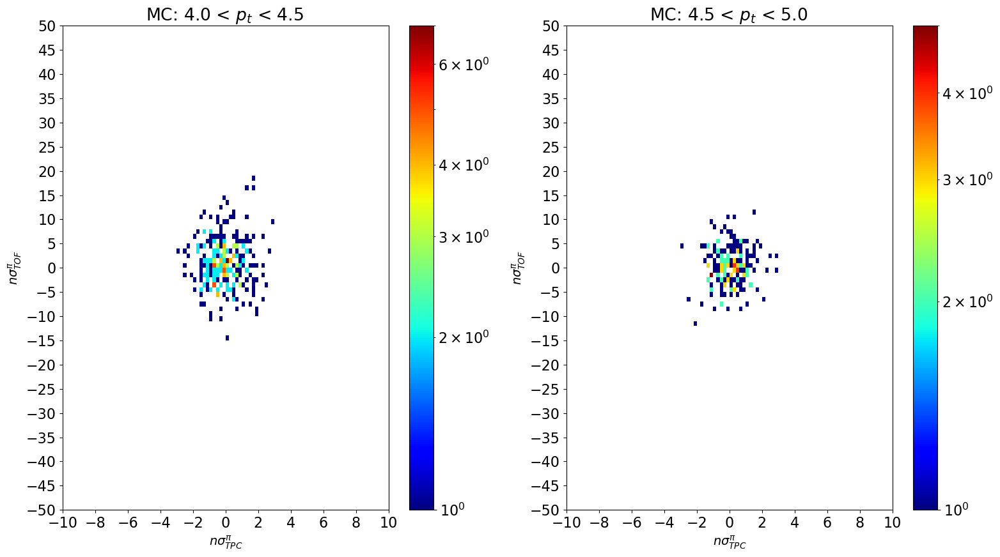

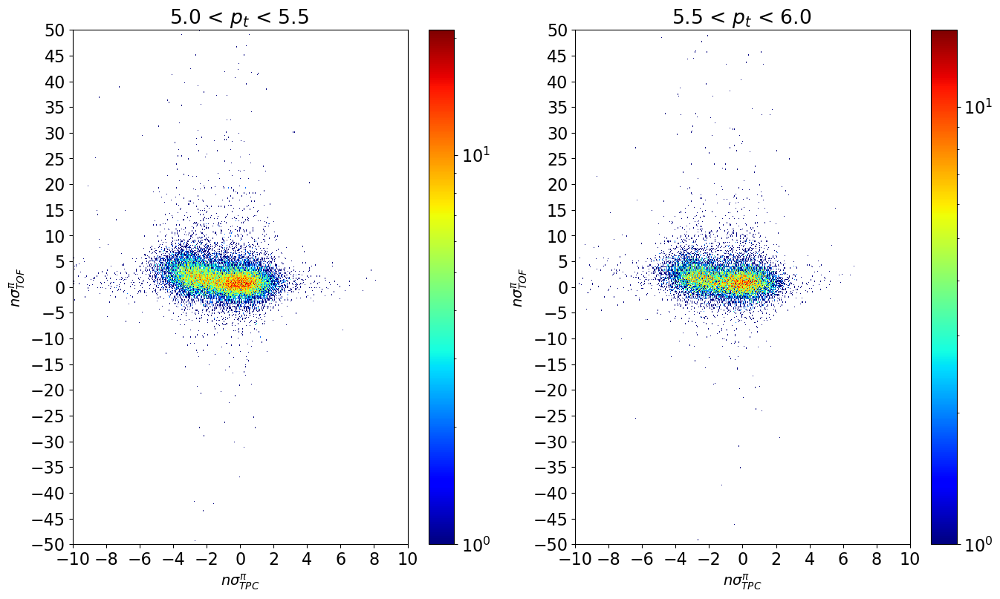

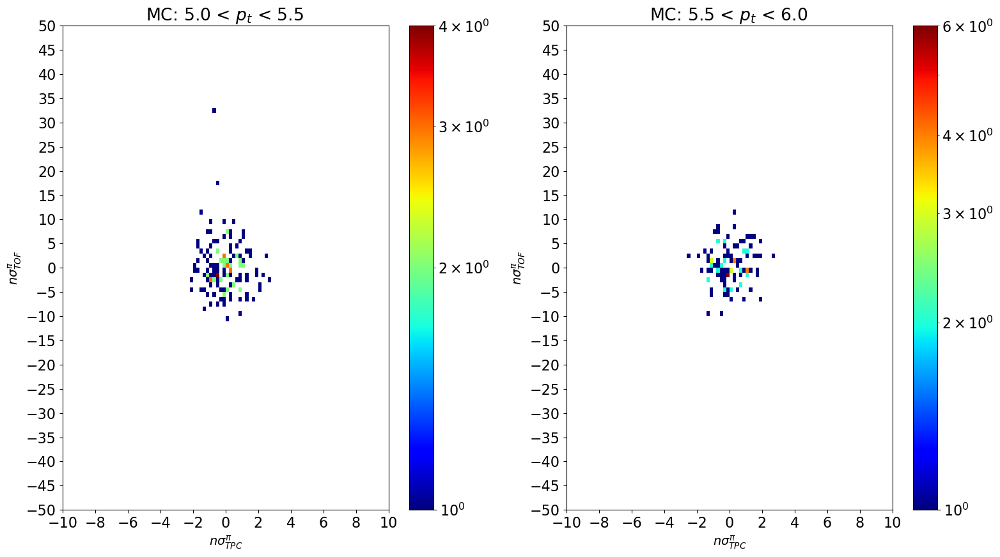

In [14]:
pt_slices = [ [0, 0.5], [0.5, 0.8], [0.8, 1.1], [1.1, 1.4], [1.4, 1.7], [1.7, 2.0], [2.0, 2.5], [2.5, 3.0], [3.0, 3.5], [3.5, 4.0],
              [4.0, 4.5], [4.5, 5.0], [5.0, 5.5], [5.5,6.0]
            ]
curr_item = 0
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
    h = ax1.hist2d(data["fNsigmaTPCpi"],data["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    fig.colorbar(h[3], ax=ax1)
    ax1.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax1.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax1.set_xlim(-10,10)
    ax1.set_xticks(np.arange(-10,10+2,2))
    ax1.set_ylim(-50,50)
    ax1.set_yticks(np.arange(-50,50+5,5))
    ax1.set_title(f"{pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h2 = ax2.hist2d(data["fNsigmaTPCpi"], data["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    fig.colorbar(h2[3], ax=ax2)
    ax2.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax2.set_xlim(-10,10)
    ax2.set_xticks(np.arange(-10,10+2,2))
    ax2.set_ylim(-50,50)
    ax2.set_yticks(np.arange(-50,50+5,5))
    ax2.set_title(f"{pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(16,9))
    h3 = ax3.hist2d(MC_data["fNsigmaTPCpi"],MC_data["fNsigmaTOFpi"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    fig.colorbar(h3[3], ax=ax3)
    ax3.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax3.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax3.set_xlim(-10,10)
    ax3.set_xticks(np.arange(-10,10+2,2))
    ax3.set_ylim(-50,50)
    ax3.set_yticks(np.arange(-50,50+5,5))
    ax3.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h4 = ax4.hist2d(MC_data["fNsigmaTPCpi"], MC_data["fNsigmaTOFpi"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    fig.colorbar(h4[3], ax=ax4)
    ax4.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax4.set_xlim(-10,10)
    ax4.set_xticks(np.arange(-10,10+2,2))
    ax4.set_ylim(-50,50)
    ax4.set_yticks(np.arange(-50,50+5,5))
    ax4.set_title(f"MC: {pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    plt.tight_layout()
    plt.show()

    curr_item += 2

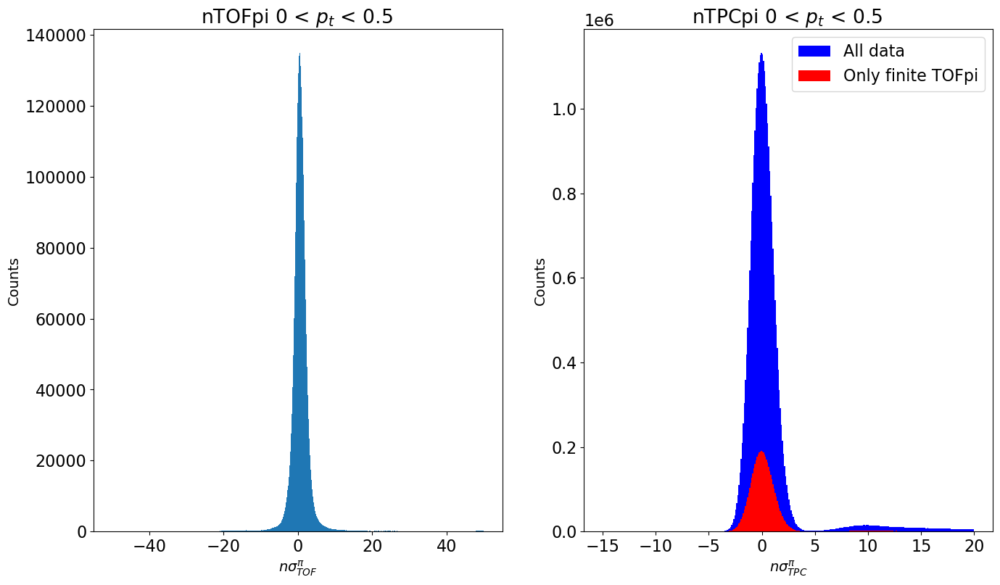

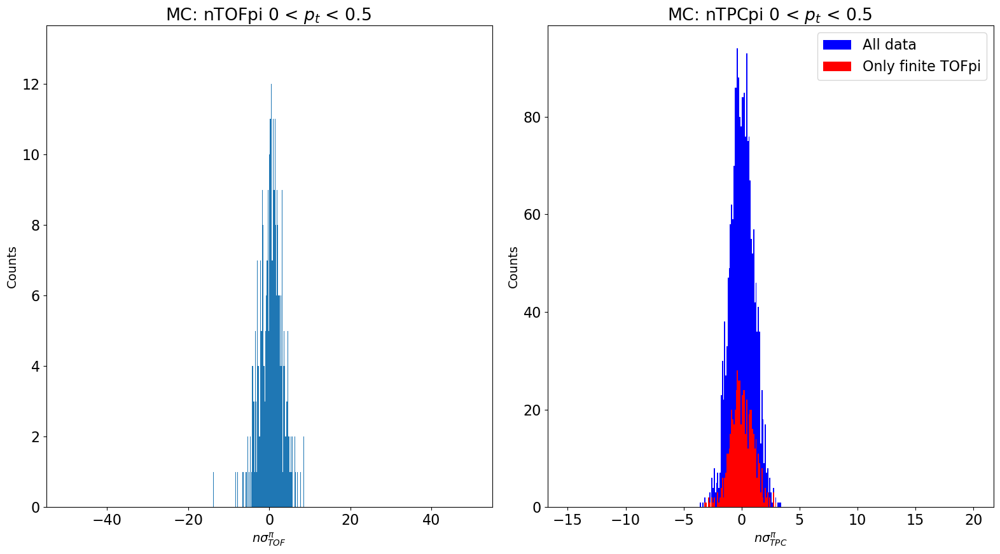

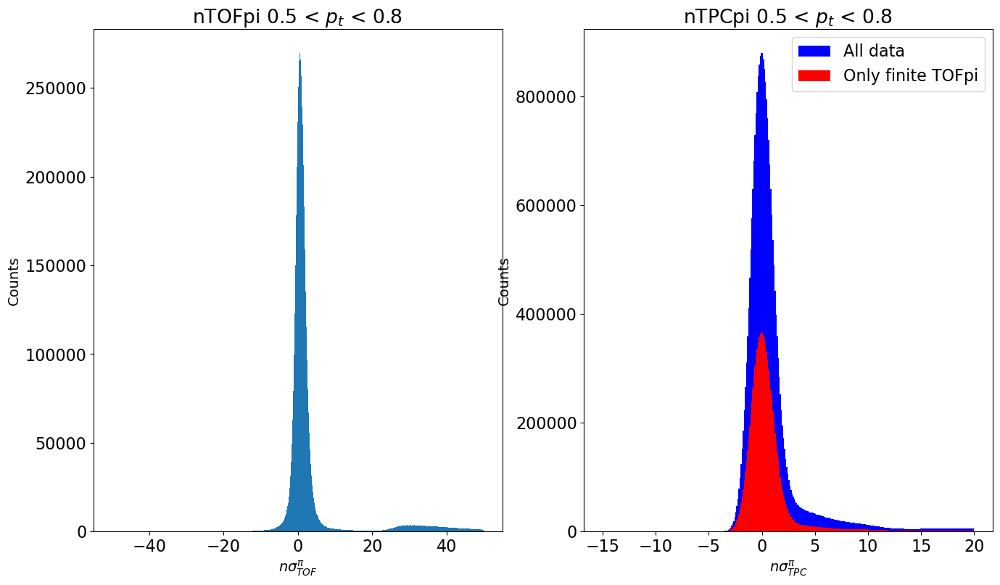

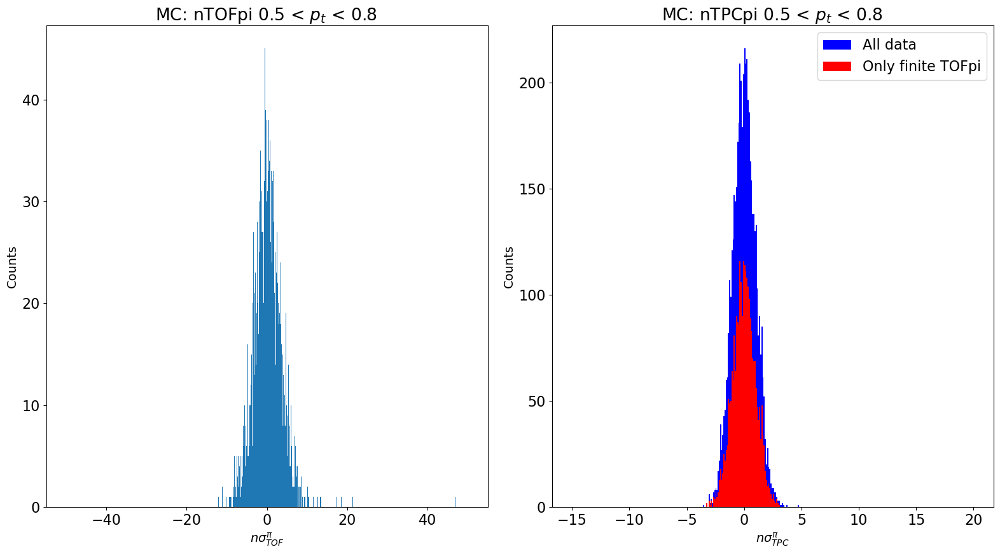

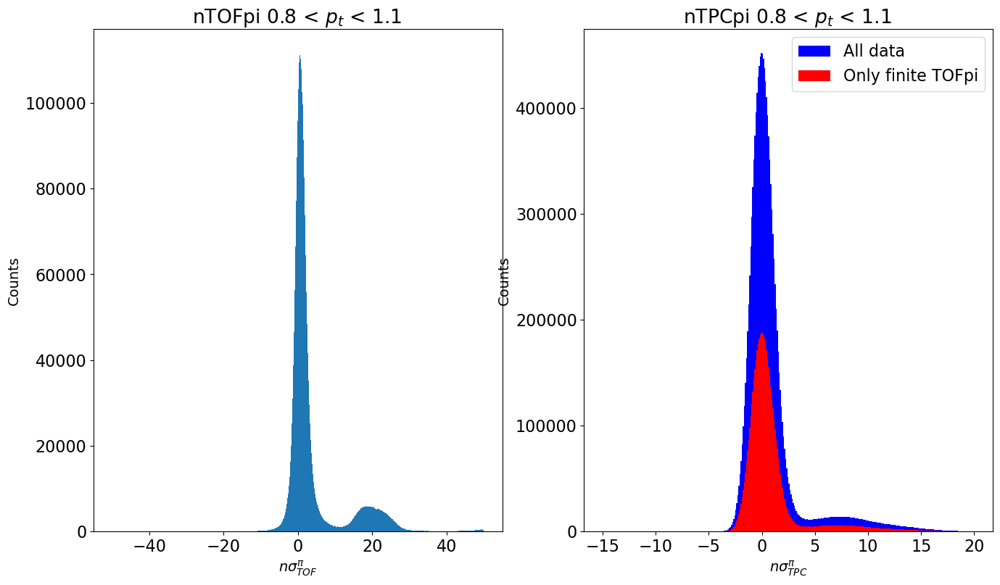

...

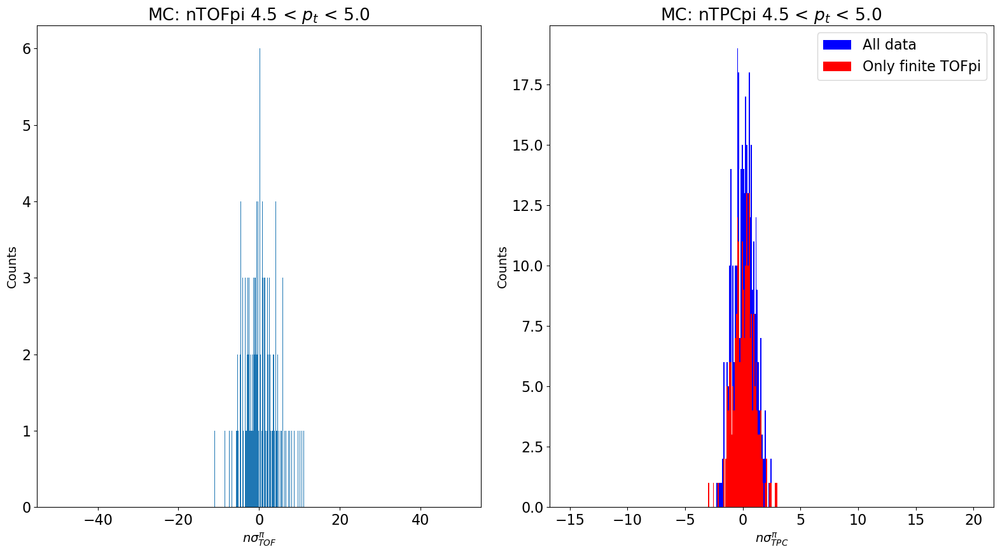

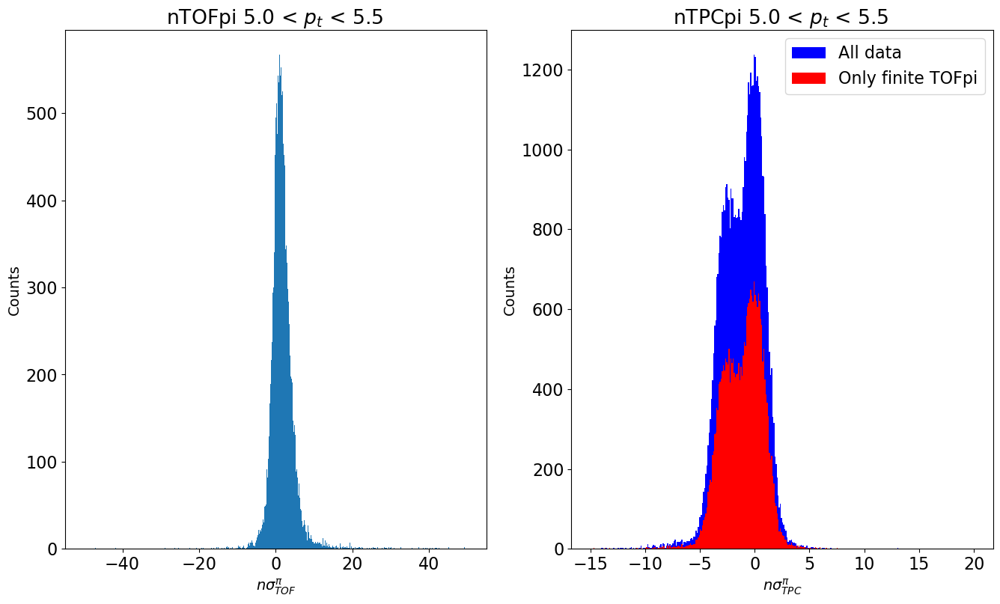

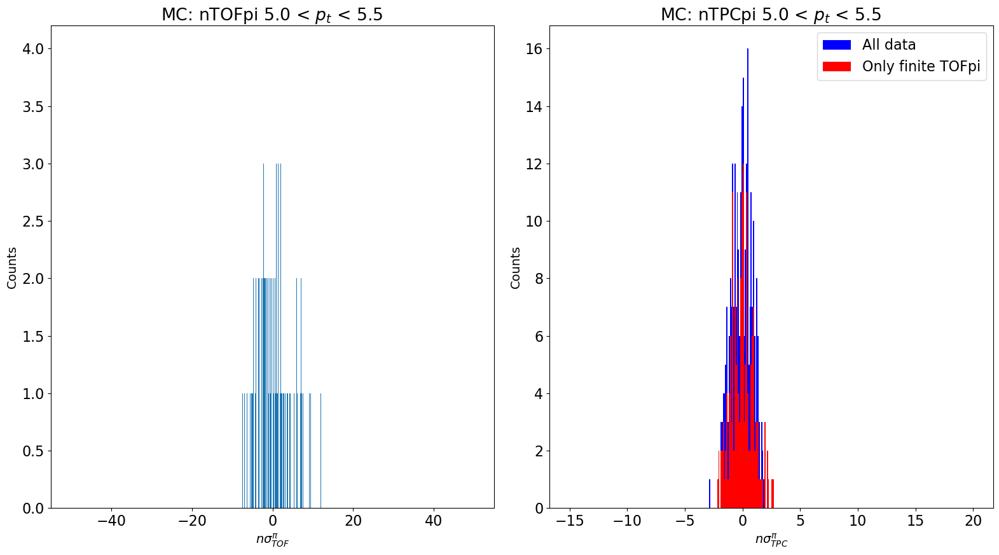

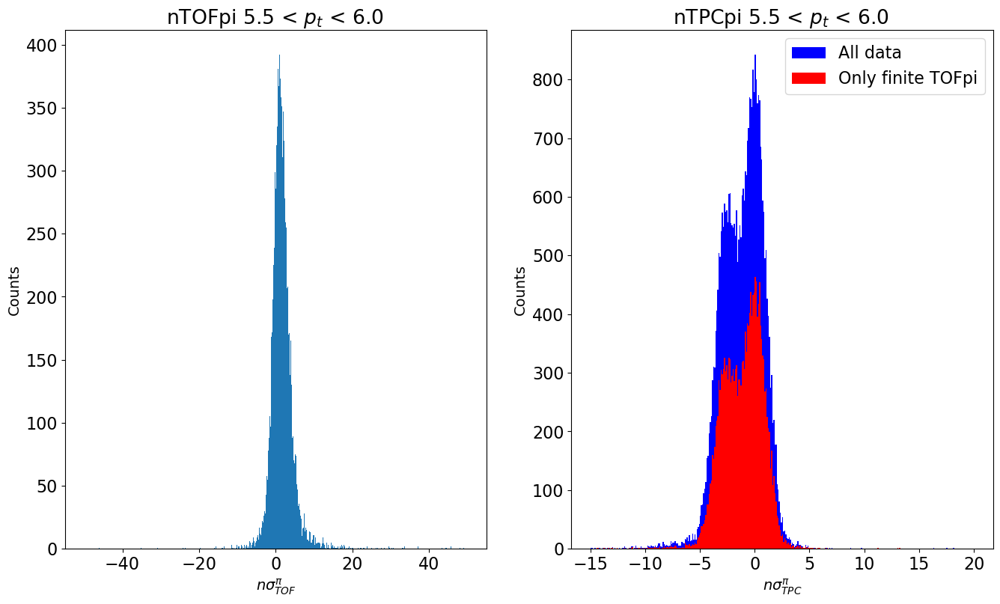

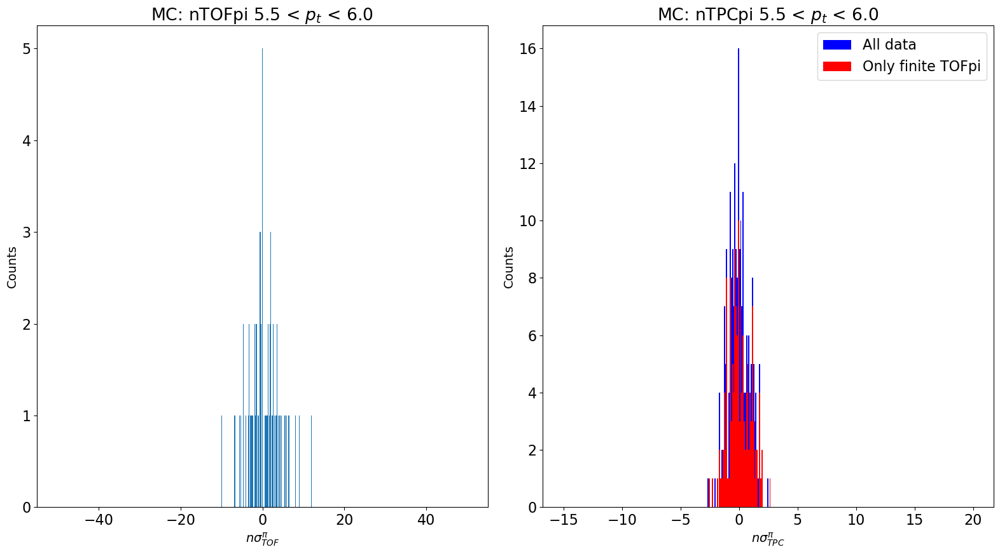

In [15]:
curr_item = 0
bin_width = 0.1
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ][["fNsigmaTOFpi", "fNsigmaTPCpi"]]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
    ax1.hist(data["fNsigmaTOFpi"], range=(-50,50), bins=np.arange(-50,50+bin_width, bin_width) )
    ax1.set_xlabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax1.set_ylabel(r"Counts", fontsize=fs)
    ax1.set_title(f"nTOFpi {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")
     
    ax2.hist(data["fNsigmaTPCpi"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="blue", label="All data")
    ax2.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"Counts", fontsize=fs)
    ax2.set_title(f"nTPCpi {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    # Does the TPCpi change if we only consider those with finite TOFpi?
    ax2.hist(data[data["fNsigmaTOFpi"]!=-999]["fNsigmaTPCpi"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="red", label="Only finite TOFpi")
    ax2.legend()

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ][["fNsigmaTOFpi", "fNsigmaTPCpi"]]
    
    fig, (ax3, ax4) = plt.subplots(1, 2, figsize=(16,9))
    ax3.hist(MC_data["fNsigmaTOFpi"], range=(-50,50), bins=np.arange(-50,50+bin_width, bin_width) )
    ax3.set_xlabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax3.set_ylabel(r"Counts", fontsize=fs)
    ax3.set_title(f"MC: nTOFpi {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")
     
    ax4.hist(MC_data["fNsigmaTPCpi"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="blue", label="All data")
    ax4.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"Counts", fontsize=fs)
    ax4.set_title(f"MC: nTPCpi {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    # Does the TPCpi change if we only consider those with finite TOFpi?
    ax4.hist(MC_data[MC_data["fNsigmaTOFpi"]!=-999]["fNsigmaTPCpi"], range=(-15,20), bins=np.arange(-15,20+bin_width, bin_width), color="red", label="Only finite TOFpi")
    ax4.legend()

    plt.tight_layout()
    plt.show()

    curr_item += 1

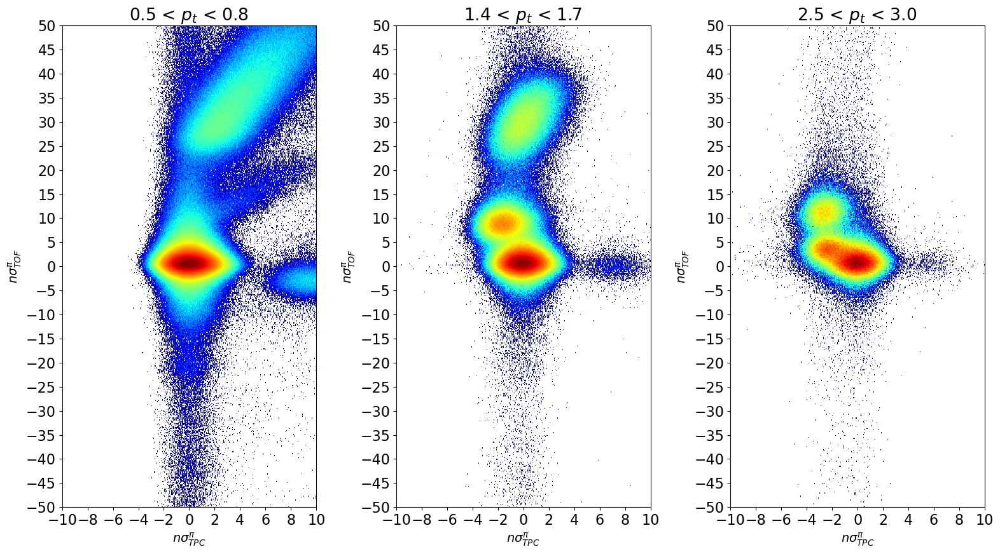

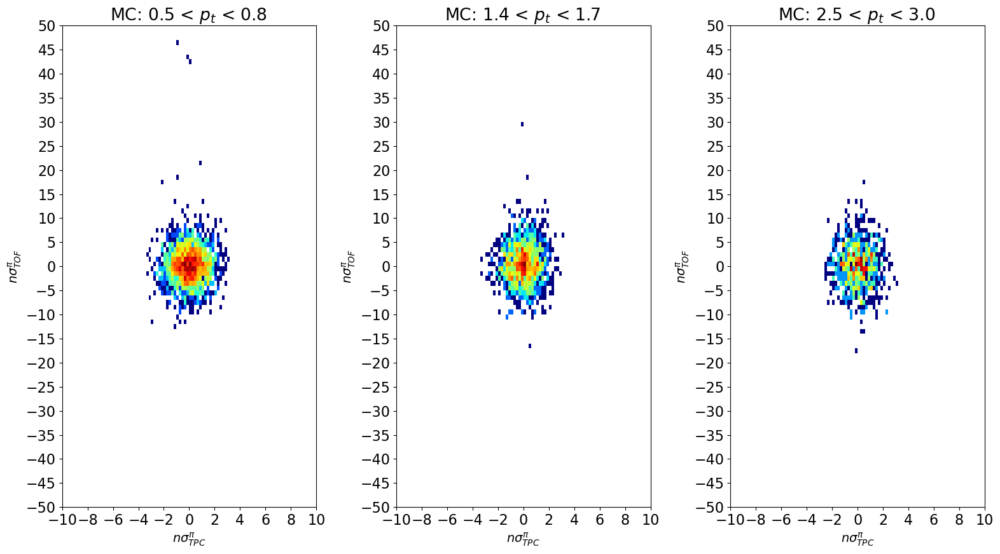

In [31]:
# all in one
pt_slices = [ [0.5, 0.8], [1.4, 1.7], [2.5, 3.0]
            ]
curr_item = 0
while (curr_item < len(pt_slices) ):
    data = real_data[ real_data["fPt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax1, ax2, axa) = plt.subplots(1, 3, figsize=(16,9))
    h = ax1.hist2d(data["fNsigmaTPCpi"],data["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(h[3], ax=ax1)
    ax1.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax1.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax1.set_xlim(-10,10)
    ax1.set_xticks(np.arange(-10,10+2,2))
    ax1.set_ylim(-50,50)
    ax1.set_yticks(np.arange(-50,50+5,5))
    ax1.set_title(f"{pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h2 = ax2.hist2d(data["fNsigmaTPCpi"], data["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    #fig.colorbar(h2[3], ax=ax2)
    ax2.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax2.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax2.set_xlim(-10,10)
    ax2.set_xticks(np.arange(-10,10+2,2))
    ax2.set_ylim(-50,50)
    ax2.set_yticks(np.arange(-50,50+5,5))
    ax2.set_title(f"{pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    data = real_data[ real_data["fPt"].between(pt_slices[curr_item+2][0], pt_slices[curr_item+2][1]) ]
     
    ha = axa.hist2d(data["fNsigmaTPCpi"], data["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    #fig.colorbar(ha[3], ax=axa)
    axa.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    axa.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    axa.set_xlim(-10,10)
    axa.set_xticks(np.arange(-10,10+2,2))
    axa.set_ylim(-50,50)
    axa.set_yticks(np.arange(-50,50+5,5))
    axa.set_title(f"{pt_slices[curr_item+2][0]} < $p_t$ < {pt_slices[curr_item+2][1]} ")

    plt.tight_layout()
    plt.savefig("RealDataTOFvsTPCPiperPt.png")
    plt.show()

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item][0], pt_slices[curr_item][1]) ]
    
    fig, (ax3, ax4, axb) = plt.subplots(1, 3, figsize=(16,9))
    h3 = ax3.hist2d(MC_data["fNsigmaTPCpi"],MC_data["fNsigmaTOFpi"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
    #fig.colorbar(h3[3], ax=ax3)
    ax3.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax3.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax3.set_xlim(-10,10)
    ax3.set_xticks(np.arange(-10,10+2,2))
    ax3.set_ylim(-50,50)
    ax3.set_yticks(np.arange(-50,50+5,5))
    ax3.set_title(f"MC: {pt_slices[curr_item][0]} < $p_t$ < {pt_slices[curr_item][1]} ")

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item+1][0], pt_slices[curr_item+1][1]) ]
     
    h4 = ax4.hist2d(MC_data["fNsigmaTPCpi"], MC_data["fNsigmaTOFpi"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    #fig.colorbar(h4[3], ax=ax4)
    ax4.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    ax4.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    ax4.set_xlim(-10,10)
    ax4.set_xticks(np.arange(-10,10+2,2))
    ax4.set_ylim(-50,50)
    ax4.set_yticks(np.arange(-50,50+5,5))
    ax4.set_title(f"MC: {pt_slices[curr_item+1][0]} < $p_t$ < {pt_slices[curr_item+1][1]} ")

    MC_data = true_pions[ true_pions["pt"].between(pt_slices[curr_item+2][0], pt_slices[curr_item+2][1]) ]
     
    hb = axb.hist2d(MC_data["fNsigmaTPCpi"], MC_data["fNsigmaTOFpi"], (100, 100), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]))
    #fig.colorbar(hb[3], ax=axb)
    axb.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
    axb.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
    axb.set_xlim(-10,10)
    axb.set_xticks(np.arange(-10,10+2,2))
    axb.set_ylim(-50,50)
    axb.set_yticks(np.arange(-50,50+5,5))
    axb.set_title(f"MC: {pt_slices[curr_item+2][0]} < $p_t$ < {pt_slices[curr_item+2][1]} ")

    plt.tight_layout()
    plt.savefig("MCDataTOFvsTPCPiperPt.png")
    plt.show()

    curr_item += 3

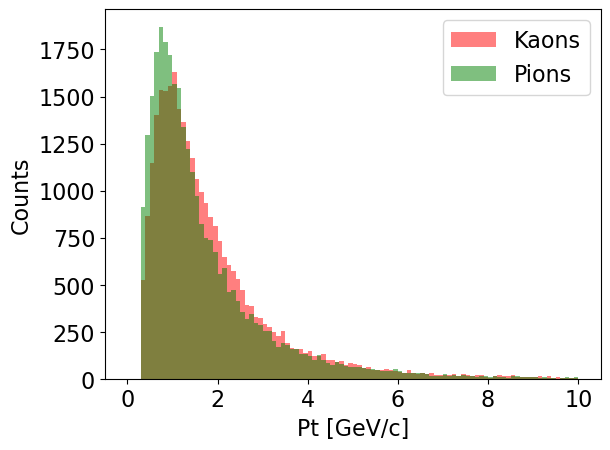

In [16]:
plt.hist(true_kaons["pt"], bins=100, range=(0,10), color="red", label="Kaons", alpha= 0.5)
plt.hist(true_pions["pt"], bins=100, range=(0,10), color="green", label="Pions", alpha = 0.5)
plt.xlabel("Pt [GeV/c]")
plt.ylabel("Counts")
plt.legend()
plt.show()

# Conclusions

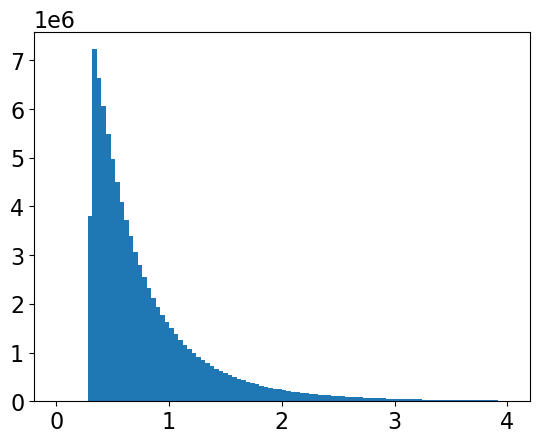

In [17]:
plt.hist(real_data["fPt"], bins=100, range=(0,4))
plt.show()

In [18]:
Ka_mask = (real_data["fNsigmaTPCka"].abs() < 2) & \
          ( 
              ( (real_data["fPt"] <= 1.4) & (real_data["fNsigmaTOFka"].abs() <= 4)  ) |
              ( (real_data["fPt"].between(1.4,2.0)) & (real_data["fNsigmaTOFka"].abs() <= 2) )
          )
Ka_candidates = real_data[Ka_mask]

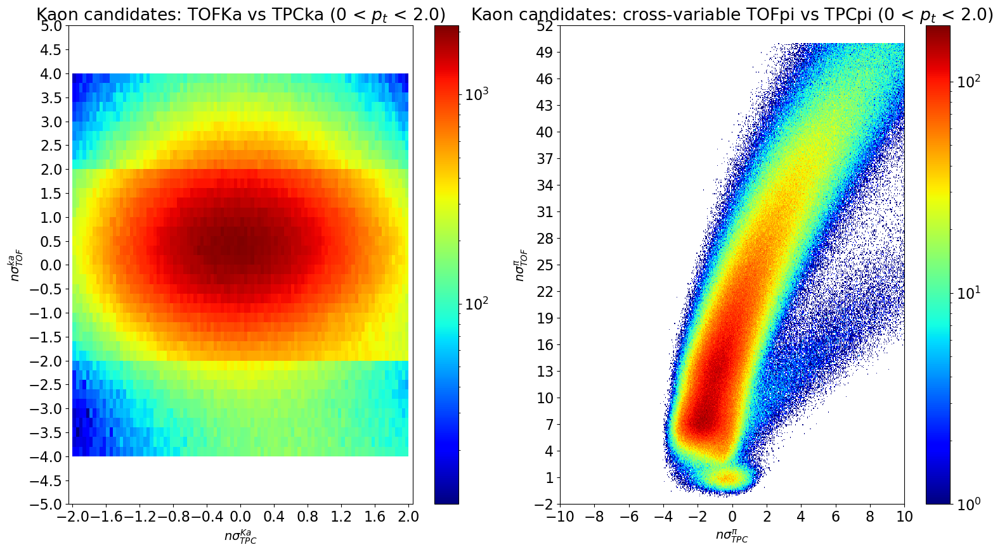

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
h = ax1.hist2d(Ka_candidates["fNsigmaTPCka"],Ka_candidates["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
fig.colorbar(h[3], ax=ax1)
ax1.set_xlabel(r"$n\sigma^{Ka}_{TPC}$", fontsize=fs)
ax1.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
ax1.set_xlim(-2.05,2.05)
ax1.set_xticks(np.arange(-2,2+0.4,0.4))
ax1.set_ylim(-5,5)
ax1.set_yticks(np.arange(-5,5+0.5,0.5))
ax1.set_title(f"Kaon candidates: TOFKa vs TPCka (0 < $p_t$ < 2.0)")

h2 = ax2.hist2d(Ka_candidates["fNsigmaTPCpi"],Ka_candidates["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-5,50]]) )
fig.colorbar(h2[3], ax=ax2)
ax2.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
ax2.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
ax2.set_xlim(-10,10)
ax2.set_xticks(np.arange(-10,10+2,2))
ax2.set_ylim(-2,50)
ax2.set_yticks(np.arange(-2,50+3,3))
ax2.set_title(f"Kaon candidates: cross-variable TOFpi vs TPCpi (0 < $p_t$ < 2.0)")
plt.tight_layout()
plt.show()

In [20]:
Pion_mask = (real_data["fNsigmaTPCpi"].abs() < 2) & \
          ( 
              ( (real_data["fPt"] <= 1.4) & (real_data["fNsigmaTOFpi"].abs() <= 4)  ) |
              ( (real_data["fPt"].between(1.4,2.0)) & (real_data["fNsigmaTOFpi"].abs() <= 2) )
          )
Pi_candidates = real_data[Pion_mask]

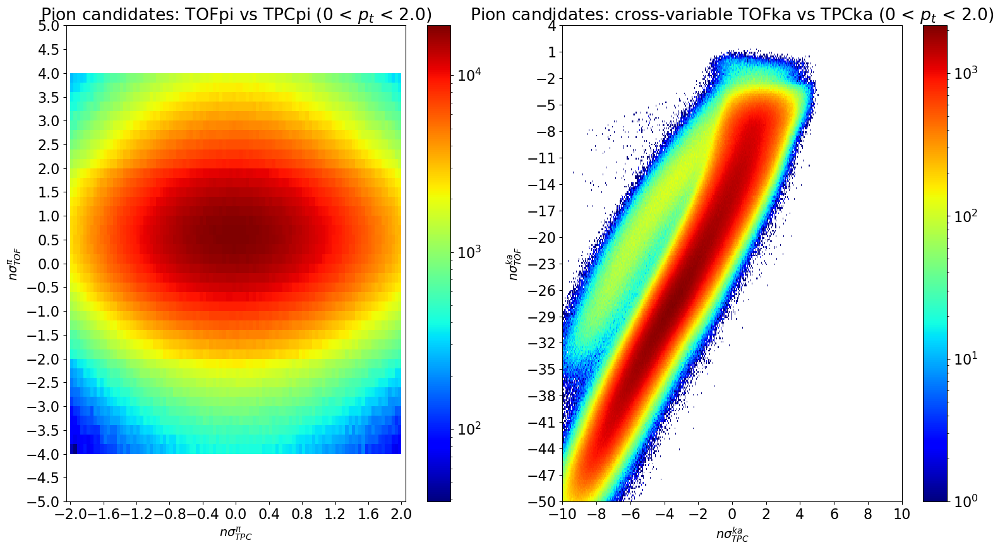

In [21]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))
h = ax1.hist2d(Pi_candidates["fNsigmaTPCpi"],Pi_candidates["fNsigmaTOFpi"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
fig.colorbar(h[3], ax=ax1)
ax1.set_xlabel(r"$n\sigma^{\pi}_{TPC}$", fontsize=fs)
ax1.set_ylabel(r"$n\sigma^{\pi}_{TOF}$", fontsize=fs)
ax1.set_xlim(-2.05,2.05)
ax1.set_xticks(np.arange(-2,2+0.4,0.4))
ax1.set_ylim(-5,5)
ax1.set_yticks(np.arange(-5,5+0.5,0.5))
ax1.set_title(f"Pion candidates: TOFpi vs TPCpi (0 < $p_t$ < 2.0)")

h2 = ax2.hist2d(Pi_candidates["fNsigmaTPCka"],Pi_candidates["fNsigmaTOFka"], (500, 500), cmap="jet", norm=LogNorm(), range=([[-10,10], [-50,50]]) )
fig.colorbar(h2[3], ax=ax2)
ax2.set_xlabel(r"$n\sigma^{ka}_{TPC}$", fontsize=fs)
ax2.set_ylabel(r"$n\sigma^{ka}_{TOF}$", fontsize=fs)
ax2.set_xlim(-10,10)
ax2.set_xticks(np.arange(-10,10+2,2))
ax2.set_ylim(-50,2)
ax2.set_yticks(np.arange(-50,2+3,3))
ax2.set_title(f"Pion candidates: cross-variable TOFka vs TPCka (0 < $p_t$ < 2.0)")
plt.tight_layout()
plt.show()

In [22]:
# Kaon hypothesis
Ka_hyp = " ( fNsigmaTPCka.abs() < 2 ) & "\
         " ( \
             ( (fPt <= 1.4) & (fNsigmaTOFka.abs() <=4) ) | \
             ( (fPt.between(1.4,2.0)) & (fNsigmaTOFka.abs() <= 2) ) \
            )"

'''
The following is equivalent to this cut for Pions
(real_data["fNsigmaTPCpi"].abs() < 2) & \
          ( 
              ( (real_data["fPt"] <= 1.4) & (real_data["fNsigmaTOFpi"].abs() <= 4)  ) |
              ( (real_data["fPt"].between(1.4,2.0)) & (real_data["fNsigmaTOFpi"].abs() <= 2) )
          )
'''

# Pion Hypothesis
Pi_hyp = " ( fNsigmaTPCpi.abs() < 2 ) & "\
         " ( \
             ( (fPt <= 1.4) & (fNsigmaTOFpi.abs() <=4) ) | \
             ( (fPt.between(1.4,2.0)) & (fNsigmaTOFpi.abs() <= 2) )\
            )"

cut_expression = f"({Ka_hyp} | {Pi_hyp})"

In [23]:
test = real_data[ real_data.eval(cut_expression) ]
display(test)

,fPt,fEta,fCharge,fDcaXY,fNsigmaTPCpi,fNsigmaTPCka,fNsigmaTOFpi,fNsigmaTOFka
1,0.54,0.54,1,1.17e-02,9.54,1.98,47.06,2.73
13,0.92,0.58,-1,-7.62e-03,-1.12,-1.11,1.19,-15.67
14,0.44,0.33,-1,-1.66e-03,0.10,-7.31,1.80,-40.64
17,0.76,0.64,-1,3.07e-04,0.81,-0.43,0.16,-21.26
31,0.61,0.29,1,-3.17e-03,0.79,-3.65,1.06,-27.31
...,...,...,...,...,...,...,...,...
89145916,1.07,0.02,-1,1.91e-03,-0.29,-0.53,-3.29,-16.14
89145922,0.60,0.69,-1,1.52e-03,-0.36,-2.95,1.14,-23.98
89145926,0.69,0.31,1,-1.04e-03,0.54,-2.46,0.63,-25.02
89145927,1.50,0.40,-1,1.01e-03,-1.32,0.01,0.54,-7.97


In [24]:
print(f"Length Kaon hyp: {len(Ka_candidates)}\nLength Pion hyp: {len(Pi_candidates)}\nLenght Either one: {len(test)}")

Length Kaon hyp: 2120415
Length Pion hyp: 18925492
Lenght Either one: 21009344


## Same cut in MC

In [25]:
# Kaons from anti-D0 are positive; Anti-D0-->truth=-1
Kaons_pos_MC = ( final_results["pos_TPCka"].abs() < 2 ) & \
           (\
             ( ( final_results["pos_pt"].between(0, 1.4) ) & (final_results["pos_TOFka"].abs()<=4) ) | \
             ( ( final_results["pos_pt"].between(1.4, 2.0) ) & (final_results["pos_TOFka"].abs()<=2) ) \
           )

# Kaons from D0 are negative; D0-->truth=1
Kaons_neg_MC = ( final_results["neg_TPCka"].abs() < 2 ) & \
           (\
             ( ( final_results["neg_pt"].between(0, 1.4) ) & (final_results["neg_TOFka"].abs()<=4) ) | \
             ( ( final_results["neg_pt"].between(1.4, 2.0) ) & (final_results["neg_TOFka"].abs()<=2) ) \
           )

Kaons_MC = Kaons_pos_MC | Kaons_neg_MC

# Pions from D0 are positive; D0-->truth=1
Pions_pos_MC = ( final_results["pos_TPCpi"].abs() < 2 ) & \
           (\
             ( ( final_results["pos_pt"].between(0, 1.4) ) & (final_results["pos_TOFpi"].abs()<=4) ) | \
             ( ( final_results["pos_pt"].between(1.4, 2.0) ) & (final_results["pos_TOFpi"].abs()<=2) ) \
           )

# Pions from anti-D0 are negative; Anti-D0-->truth=-1
Pions_neg_MC = ( final_results["neg_TPCpi"].abs() < 2 ) & \
           (\
             ( ( final_results["neg_pt"].between(0, 1.4) ) & (final_results["neg_TOFpi"].abs()<=4) ) | \
             ( ( final_results["neg_pt"].between(1.4, 2.0) ) & (final_results["neg_TOFpi"].abs()<=2) ) \
           )

Pions_MC = Pions_pos_MC | Pions_neg_MC

Undecided = Kaons_MC & Pions_MC

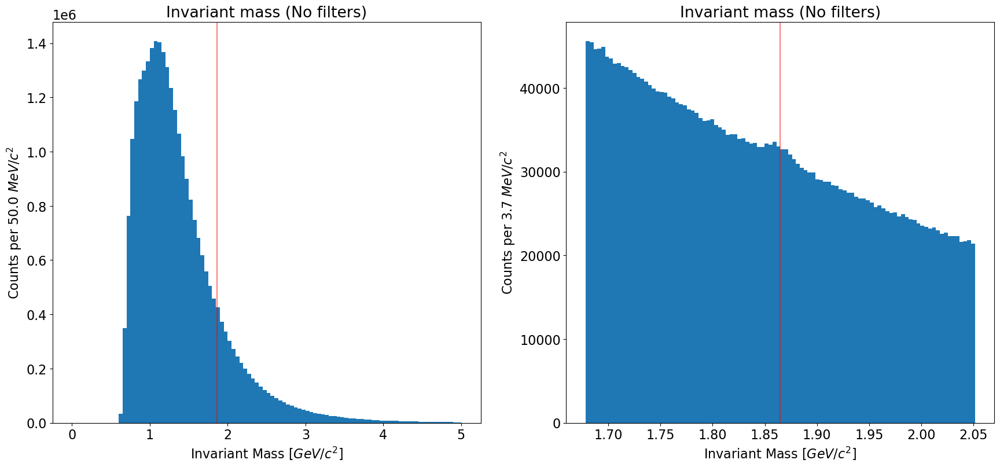

In [26]:
# Particle masses in GeV
m_K = 0.493677
m_pi = 0.139570
m_d0 = 1.86484

MC_masses = np.concatenate( [final_results[Kaons_pos_MC & (~Pions_MC)]["anti_mass"],
                            final_results[Kaons_neg_MC & (~Pions_MC)]["inv_mass"],
                            final_results[Pions_pos_MC & (~Kaons_MC)]["inv_mass"],
                            final_results[Pions_neg_MC & (~Kaons_MC)]["anti_mass"],
                            final_results[Undecided]["inv_mass"],
                            final_results[Undecided]["anti_mass"]]
                          )

# Now with some filtering
COS_CUT = 0.90
PT_MIN, PT_MAX = 2, 8                                  # +infinity is np.inf
MASS_MIN, MASS_MAX = 0, 5
DCA_CUT = 3e-03
N_BINS = 100

fig, ax = plt.subplots(1,2, figsize=(21,9) )
ax[0].hist(MC_masses,range=(MASS_MIN,MASS_MAX), bins=N_BINS)
ax[0].axvline(x=m_d0, color="red", alpha=0.5)
ax[0].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[0].set_ylabel(f"Counts per {((MASS_MAX-MASS_MIN)/N_BINS *1000):.1f} $MeV/c^2$")
ax[0].set_title(f"Invariant mass (No filters)")

M_min, M_max = 0.9, 1.1
N_bins = 100
ax[1].hist(MC_masses,range=(m_d0*M_min,m_d0*M_max), bins=N_bins)
ax[1].axvline(x=m_d0, color="red", alpha=0.5)
ax[1].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[1].set_ylabel(f"Counts per {(((M_max-M_min)*m_d0)/N_bins *1000):.1f} $MeV/c^2$")
ax[1].set_title(f"Invariant mass (No filters)")
plt.show()

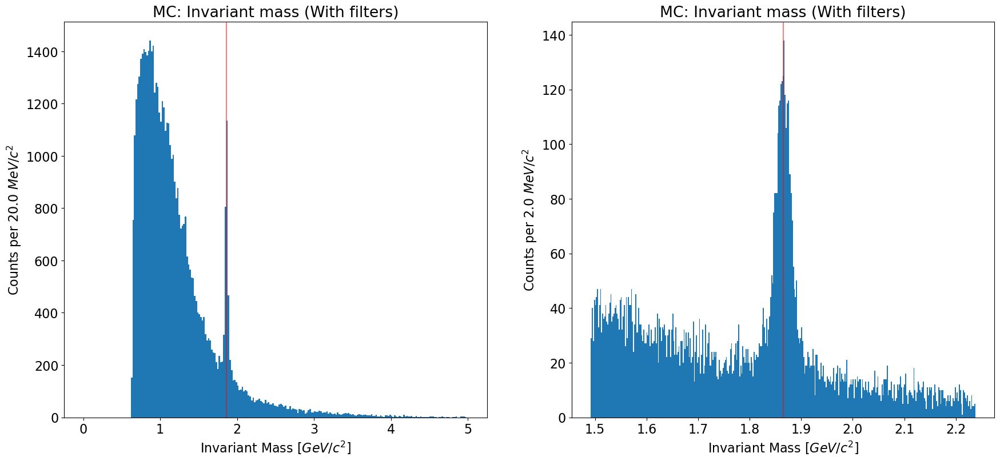

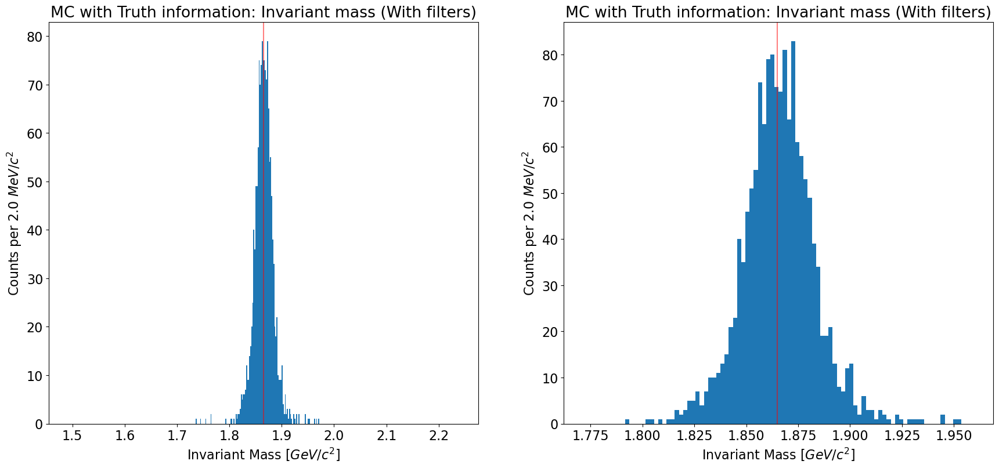

In [30]:
# Particle masses in GeV
m_K = 0.493677
m_pi = 0.139570
m_d0 = 1.86484

# Now with some filtering
COS_CUT = 0.98
PT_MIN, PT_MAX = 2, 8                                  # +infinity is np.inf
MASS_MIN, MASS_MAX = 0, 5
DCA_CUT = -2e-05
binwidth = 2e-03

filter_mask = (final_results["cos_pointing"] > COS_CUT) & (final_results["pt"].between(PT_MIN, PT_MAX)) & (final_results["dcaXY_product"] < DCA_CUT)

MC_masses = np.concatenate( [final_results[filter_mask & Kaons_pos_MC & (~Pions_MC)]["anti_mass"],
                            final_results[filter_mask & Kaons_neg_MC & (~Pions_MC)]["inv_mass"],
                            final_results[filter_mask & Pions_pos_MC & (~Kaons_MC)]["inv_mass"],
                            final_results[filter_mask & Pions_neg_MC & (~Kaons_MC)]["anti_mass"],
                            final_results[filter_mask & Undecided]["inv_mass"],
                            final_results[filter_mask & Undecided]["anti_mass"]]
                          )



fig, ax = plt.subplots(1,2, figsize=(21,9) )
ax[0].hist(MC_masses,range=(MASS_MIN,MASS_MAX), bins=np.arange(MASS_MIN,MASS_MAX+binwidth, binwidth*10))
ax[0].axvline(x=m_d0, color="red", alpha=0.5)
ax[0].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[0].set_ylabel(f"Counts per {(binwidth *1000*10):.1f} $MeV/c^2$")
ax[0].set_title(f"MC: Invariant mass (With filters)")

M_min, M_max = 0.8, 1.2
N_bins = 150
ax[1].hist(MC_masses,range=(m_d0*M_min,m_d0*M_max), bins=np.arange(m_d0*M_min,m_d0*M_max+binwidth, binwidth))
ax[1].axvline(x=m_d0, color="red", alpha=0.5)
ax[1].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[1].set_ylabel(f"Counts per {(binwidth*1000):.1f} $MeV/c^2$")
ax[1].set_title(f"MC: Invariant mass (With filters)")
plt.show()

truth_MC = final_results["truth"].abs() == 1
cut_truth_MC = truth_MC & ( Kaons_MC | Pions_MC | Undecided )
result_truth_MC = final_results[cut_truth_MC & filter_mask]

truth_masses = np.concatenate( [result_truth_MC[result_truth_MC["truth"]==1]["inv_mass"],
                                result_truth_MC[result_truth_MC["truth"]==-1]["anti_mass"]
                               ])

fig, ax = plt.subplots(1,2, figsize=(21,9) )
M_min, M_max = 0.8, 1.2
N_bins = 150
ax[0].hist(truth_masses,range=(m_d0*M_min,m_d0*M_max), bins=np.arange(m_d0*M_min,m_d0*M_max+binwidth, binwidth))
ax[0].axvline(x=m_d0, color="red", alpha=0.5)
ax[0].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[0].set_ylabel(f"Counts per {(binwidth*1000):.1f} $MeV/c^2$")
ax[0].set_title(f"MC with Truth information: Invariant mass (With filters)")

M_min, M_max = 0.95, 1.05
N_bins = 150
ax[1].hist(truth_masses,range=(m_d0*M_min,m_d0*M_max), bins=np.arange(m_d0*M_min,m_d0*M_max+binwidth, binwidth))
ax[1].axvline(x=m_d0, color="red", alpha=0.5)
ax[1].set_xlabel("Invariant Mass $[GeV/c^2]$")
ax[1].set_ylabel(f"Counts per {(binwidth*1000):.1f} $MeV/c^2$")
ax[1].set_title(f"MC with Truth information: Invariant mass (With filters)")
plt.show()

In [ ]:
# Load the file.
        with uproot.open(file_path) as file:
            # Load TTrees from directories
            names_track_extr = file.keys(filter_name=r"*O2filtertrackextr")[ID_split[0]: ID_split[-1]+1]
            names_track      = file.keys(filter_name=r"*O2filtertrack")[ID_split[0]: ID_split[-1]+1]
            names_coll       = file.keys(filter_name=r"*O2collision_001")[ID_split[0]: ID_split[-1]+1]
    
        # Variable to correct the index of the collision (because it starts from 0 at each new TTree).
        collision_offset = 0
        # Container for the dataframes created with the pairs.
        list_of_df = []               
    
        for i in range(len(names_coll)):
    
            # Read collision tree.
            df_coll = file[ names_coll[i] ].arrays(["fPosX", "fPosY", "fPosZ"], library="pd")   
        
            # Read track and trackextr using boolean mask for hypothesis on particle identity.
            df_trackextr = file[ names_track_extr[i] ].arrays(["fPt", "fEta", "fCharge", "fDcaXY", "fNsigmaTPCpi", "fNsigmaTPCka",
                                                               "fNsigmaTOFpi", "fNsigmaTOFka"], library="pd" )
            df_track = file[ names_track[i] ].arrays(["fIndexCollisions", "fAlpha", "fX", "fY", "fZ"], library="pd")
            
            # Merge all rows: fIndexCollisions in O2filtertrack must match the index in O2collision_001;
            # O2filtertrack and O2filtertrackextr, instead, match 1:1 row-wise.
            df_track = pd.merge(left=df_track, right=df_coll, how="inner", left_on = "fIndexCollisions", right_index=True)
            df_trackextr = pd.merge(left=df_trackextr, right=df_track, how='inner', left_index=True, right_index=True)
            
            # Assign particle nature hypothesis based on the chosen cuts.
            mask_both = df_trackextr.eval(f"({Ka_hyp} & {Pi_hyp})")
            mask_Ka = df_trackextr.eval(Ka_hyp)
            mask_Pi = df_trackextr.eval(Pi_hyp)
            
            # From the documentation of numpy select: numpy.select(condlist, choicelist, default=0)
            # When multiple conditions are satisfied, the first one encountered in condlist is used.
            df_trackextr["Hyp"] = np.select([mask_both, mask_Ka, mask_Pi], ["Both", "Kaon", "Pion"], default="Bkg")
            
            # Apply the SAME filter to df_trackextr and df_track to keep them aligned (and keep only useful columns).
            mask = mask_Ka | mask_Pi
            df_trackextr = df_trackextr.loc[mask, ["fIndexCollisions","fAlpha", "fX", "fY", "fZ","fPt", "fEta", "fCharge", "fDcaXY","Hyp",
                                                   "fPosX", "fPosY", "fPosZ", "fNsigmaTPCpi", "fNsigmaTPCka", "fNsigmaTOFpi", "fNsigmaTOFka"] ]
        
            # The rows where the fIndexCollision is negative have been excluded thanks to the merge on the index of collision, which can only be
            # non-negative. So, we keep only those with |fPosZ| < 10 and |pseudorapidity| < 0.8
            valid = ( df_trackextr["fPosZ"].abs() < 10 ) & ( df_trackextr["fEta"].abs() < 0.8 )
            df_trackextr = df_trackextr[valid].reset_index(drop=True)
    
            # Fix local fIndexCollisions → global index. 
            df_trackextr["fIndexCollisions"] += collision_offset   
        
            # Save results in the container list.
            list_of_df.append( df_trackextr )
            
            # Update offset for next loop.
            collision_offset += len(df_coll)